# ENVIRONMENT

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.formula.api import ols
from statsmodels.api import qqplot
from statsmodels.tools import add_constant
import statsmodels.api as sm

from sklearn import linear_model
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import RidgeCV
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.feature_selection import RFE
from sklearn.feature_selection import RFECV
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import LassoCV
from sklearn import preprocessing

from statsmodels.graphics.mosaicplot import mosaic
from statsmodels.formula.api import logit
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
from sklearn import metrics


# suppress scientific notation in Pandas
pd.options.display.float_format = "{:.2f}".format
pd.set_option("display.max_columns", 100)
pd.set_option("display.max_rows", 100)
pd.set_option('precision', 3)

plt.rcParams['figure.figsize'] = [12, 10]
plt.rcParams['figure.dpi'] = 150

sns.set()
sns.set_context("notebook", rc={"lines.linewidth": 2.5})
sns.set_style("whitegrid")

import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv("../TASK 2 - LOGISTIC REGRESSION FOR PREDICTIVE MODELING/src/medical_clean.csv")

In [3]:
df.fillna(df.mean(), inplace=True)

In [4]:
df.shape

(10000, 50)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 50 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   CaseOrder           10000 non-null  int64  
 1   Customer_id         10000 non-null  object 
 2   Interaction         10000 non-null  object 
 3   UID                 10000 non-null  object 
 4   City                10000 non-null  object 
 5   State               10000 non-null  object 
 6   County              10000 non-null  object 
 7   Zip                 10000 non-null  int64  
 8   Lat                 10000 non-null  float64
 9   Lng                 10000 non-null  float64
 10  Population          10000 non-null  int64  
 11  Area                10000 non-null  object 
 12  TimeZone            10000 non-null  object 
 13  Job                 10000 non-null  object 
 14  Children            10000 non-null  int64  
 15  Age                 10000 non-null  int64  
 16  Incom

In [6]:
df.describe()

,CaseOrder,Zip,Lat,Lng,Population,Children,Age,Income,VitD_levels,Doc_visits,Full_meals_eaten,vitD_supp,Initial_days,TotalCharge,Additional_charges,Item1,Item2,Item3,Item4,Item5,Item6,Item7,Item8
count,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00
mean,5000.50,50159.32,38.75,-91.24,9965.25,2.10,53.51,40490.50,17.96,5.01,1.00,0.40,34.46,5312.17,12934.53,3.52,3.51,3.51,3.52,3.50,3.52,3.49,3.51
std,2886.90,27469.59,5.40,15.21,14824.76,2.16,20.64,28521.15,2.02,1.05,1.01,0.63,26.31,2180.39,6542.60,1.03,1.03,1.03,1.04,1.03,1.03,1.02,1.04
min,1.00,610.00,17.97,-174.21,0.00,0.00,18.00,154.08,9.81,1.00,0.00,0.00,1.00,1938.31,3125.70,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00
25%,2500.75,27592.00,35.26,-97.35,694.75,0.00,36.00,19598.78,16.63,4.00,0.00,0.00,7.90,3179.37,7986.49,3.00,3.00,3.00,3.00,3.00,3.00,3.00,3.00
50%,5000.50,50207.00,39.42,-88.40,2769.00,1.00,53.00,33768.42,17.95,5.00,1.00,0.00,35.84,5213.95,11573.98,4.00,3.00,4.00,4.00,3.00,4.00,3.00,3.00
75%,7500.25,72411.75,42.04,-80.44,13945.00,3.00,71.00,54296.40,19.35,6.00,2.00,1.00,61.16,7459.70,15626.49,4.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00
max,10000.00,99929.00,70.56,-65.29,122814.00,10.00,89.00,207249.10,26.39,9.00,7.00,5.00,71.98,9180.73,30566.07,8.00,7.00,8.00,7.00,7.00,7.00,7.00,7.00


In [7]:
df.head()

,CaseOrder,Customer_id,Interaction,UID,City,State,County,Zip,Lat,Lng,Population,Area,TimeZone,Job,Children,Age,Income,Marital,Gender,ReAdmis,VitD_levels,Doc_visits,Full_meals_eaten,vitD_supp,Soft_drink,Initial_admin,HighBlood,Stroke,Complication_risk,Overweight,Arthritis,Diabetes,Hyperlipidemia,BackPain,Anxiety,Allergic_rhinitis,Reflux_esophagitis,Asthma,Services,Initial_days,TotalCharge,Additional_charges,Item1,Item2,Item3,Item4,Item5,Item6,Item7,Item8
0,1,C412403,8cd49b13-f45a-4b47-a2bd-173ffa932c2f,3a83ddb66e2ae73798bdf1d705dc0932,Eva,AL,Morgan,35621,34.35,-86.73,2951,Suburban,America/Chicago,"Psychologist, sport and exercise",1,53,86575.93,Divorced,Male,No,19.14,6,0,0,No,Emergency Admission,Yes,No,Medium,No,Yes,Yes,No,Yes,Yes,Yes,No,Yes,Blood Work,10.59,3726.70,17939.40,3,3,2,2,4,3,3,4
1,2,Z919181,d2450b70-0337-4406-bdbb-bc1037f1734c,176354c5eef714957d486009feabf195,Marianna,FL,Jackson,32446,30.85,-85.23,11303,Urban,America/Chicago,Community development worker,3,51,46805.99,Married,Female,No,18.94,4,2,1,No,Emergency Admission,Yes,No,High,Yes,No,No,No,No,No,No,Yes,No,Intravenous,15.13,4193.19,17613.00,3,4,3,4,4,4,3,3
2,3,F995323,a2057123-abf5-4a2c-abad-8ffe33512562,e19a0fa00aeda885b8a436757e889bc9,Sioux Falls,SD,Minnehaha,57110,43.54,-96.64,17125,Suburban,America/Chicago,Chief Executive Officer,3,53,14370.14,Widowed,Female,No,18.06,4,1,0,No,Elective Admission,Yes,No,Medium,Yes,No,Yes,No,No,No,No,No,No,Blood Work,4.77,2434.23,17505.19,2,4,4,4,3,4,3,3
3,4,A879973,1dec528d-eb34-4079-adce-0d7a40e82205,cd17d7b6d152cb6f23957346d11c3f07,New Richland,MN,Waseca,56072,43.90,-93.51,2162,Suburban,America/Chicago,Early years teacher,0,78,39741.49,Married,Male,No,16.58,4,1,0,No,Elective Admission,No,Yes,Medium,No,Yes,No,No,No,No,No,Yes,Yes,Blood Work,1.71,2127.83,12993.44,3,5,5,3,4,5,5,5
4,5,C544523,5885f56b-d6da-43a3-8760-83583af94266,d2f0425877b10ed6bb381f3e2579424a,West Point,VA,King William,23181,37.60,-76.89,5287,Rural,America/New_York,Health promotion specialist,1,22,1209.56,Widowed,Female,No,17.44,5,0,2,Yes,Elective Admission,No,No,Low,No,No,No,Yes,No,No,Yes,No,No,CT Scan,1.25,2113.07,3716.53,2,1,3,3,5,3,4,3


# Part I: Research Question 
---

## A.  Describe the purpose of this data analysis by doing the following:



### 1.  Summarize one research question that is relevant to a real-world organizational situation captured in the data set you have selected and that you will answer using logistic regression.
*The summary includes 1 research question that is relevant to a realistic organizational situation and can be addressed using the selected data set and logistic regression.*
<br />*The scenarios described on page 1 of both the churn dataset and the medical dataset are just examples. Even though these say, "You have been asked to..." it does not mean that you should use the example scenario as the basis for your analysis in D208. In fact, both example scenarios use a categorical dependent variable, which is appropriate for logistic regression but not for linear regression because linear regression requires a continuous dependent variable.*

Based on the Medical Readmission dataset, can we predict a patient's additional medical charges based on a patient's demographics and pre-existing health conditions? The Null Hypothesis is that a patient's demographics and pre-existing health conditions do not influence a patient's additional medical charges. The Alternative Hypothesis is that a patient's demographics and pre-existing health conditions likely influence a patient's additional medical charges. We'll test this hypothesis using multiple linear regression.

---
- what factors determine the probability of being readmitted to the hospital?
- Is the probability of being readmitted influenced by how a patient was initially admitted to the hospital?
- Is the probability of being readmitted influenced by the patient's initial hospital admission details?
- Is the probability of being readmitted influenced by a patients geographic area type?
- Is the probability of being readmitted influenced by a patients gender?
- Is the probability of being readmitted influenced by a patients gender and geographic data?
- Is the probability of being readmitted affected by pre-existing health conditions?
- Is the probability of being readmitted affected by the primary care type the patient received?
- Do "Complication_risk", and "Doc_visits" have an influence on the probability of readmission?

In [8]:
TARGET_VAR = "ReAdmis"

### 2.  Define the objectives or goals of the data analysis. Ensure that your objectives or goals are reasonable within the scope of the data dictionary and are represented in the available data.
*The submission clearly defines the objectives or goals of the data analysis, and the objectives or goals are reasonable for the scope of the scenario and are represented in the available data.*

There are several key objectives for this data analysis. The primary objective is to create a model that models a linear relationship between a patient's additional medical charges (dependent variable) and multiple independent variables related to a patient's demographics and health conditions. Additional medical charges can occur for a multitude of reasons, so this model will determine what — if any — relationship exists between the patient's data and additional charges. Furthermore, we'll determine if several explanatory variables can approximate a patient's additional medical charges.

Ultimately the goal is to provide patients and healthcare providers with more accurate cost estimates. Additionally, if this model proves accurate, it will provide data to inform patients as to what factors — if any — may result in additional medical charges.

---
- determine if a patient will be readmitted
- prevent patient readmission
- if possible provide more focused care to those that are likely to be re-admitted
- re-valuate patient testing/monitoring protocols
- perform more tests on those that are likely to be readmitted
- when appropriate, discharge patients earlier if they are not likely to be readmitted 
- consider extending stay for those patients



# ✅ Part II: Method Justification
---

## B.  Describe logistic regression methods by doing the following:

### 1.  ✅ Summarize the assumptions of a logistic regression model.
*The submission accurately summarizes the assumptions of a logistic regression model.*



There are several assumptions about a multiple regression model. First, we expect a linear relationship between the target and explanatory variables where the model's explanatory power increases with the number of explanatory variables. Secondly, data observations are selected independently and randomly from the population using statistically valid methods (Bevans, 2020). Additionally, the explanatory variables are not highly correlated, meaning there is no relationship or collinearity among independent variables (Bevans, 2020). Next, we expect that the data follow a normal distribution. We expect the model to produce a straight regression line through the data points with residuals normally distributed with a mean of 0. Lastly, we anticipate consistent homoscedasticity throughout the independent variables.

---

- "Logistic regression does not make many of the key assumptions of linear regression and general linear models that are based on ordinary least squares algorithms – particularly regarding linearity, normality, homoscedasticity, and measurement level. First, logistic regression does not require a linear relationship between the dependent and independent variables.  Second, the error terms (residuals) do not need to be normally distributed.  Third, homoscedasticity is not required.  Finally, the dependent variable in logistic regression is not measured on an interval or ratio scale." - https://www.statisticssolutions.com/free-resources/directory-of-statistical-analyses/assumptions-of-logistic-regression/

- https://www.statology.org/assumptions-of-logistic-regression/
    - The Response Variable is Binary
    - The Observations are Independent
    - There is No Multicollinearity Among Explanatory Variables
    - There are No Extreme Outliers
    - There is a Linear Relationship Between Explanatory Variables and the Logit of the Response Variable
    - The Sample Size is Sufficiently Large
    - In contrast to linear regression, logistic regression does not require:
        - A linear relationship between the explanatory variable(s) and the response variable.
        - The residuals of the model to be normally distributed.
        - The residuals to have constant variance, also known as homoscedasticity.

- https://towardsdatascience.com/assumptions-of-logistic-regression-clearly-explained-44d85a22b290
    - Appropriate Outcome Type
    - Linearity of independent variables and log-odds
    - No strongly influential outliers
    - Absence of Multicollinearity
    - Independence of observations
    
- https://techdifferences.com/difference-between-linear-and-logistic-regression.html 
    - Logistic regression does not make many of the key assumptions of linear such as linearity, normality, homoscedasticity, and measurement level. 

- slides
    - It is based on the Bernoulli distribution rather than Gaussian because the dependent variable is binary.
    - The predicted values are restricted to a range of nomial values like ‘Yes’ ‘No’, S, M, L
    - it predicts the probability of particular outcomes rather than the outcome itself.
    - it is the logarithm of the odds of achieving 1.
    - Logistic regression requires a large sample size.

    
    A. Like all regression analyses, it is a predictive analysis.

    B.  Used to describe data and explain relationship between one dependent binary variable and one or more nominal, ordinal, interval or ratio-level independent variables.

    C.  No high correlations (multicollinearity) among the predictors.

    D.  Used to model the probability of a certain class or event existing such as pass/fail, win/lose, alive/dead or healty/sick.
    

### 2.  ✅ Describe the benefits of using the tool(s) you have chosen (i.e., Python, R, or both) in support of various phases of the analysis.
*The submission describes the benefits of using the tool(s) chosen in support of the various phases of the logistic regression analysis, and the benefits logically align with the goal of the analysis.*



We'll use several tools and technologies to support the multiple regression analysis. The primary tools we'll discuss are Jupyter Notebooks, NumPy, Matplotlib, Pandas, Python, Seaborn, Scikit-Learn, and Statsmodels.

Jupyter Notebooks is beneficial because it offers seamless integration of python, data visualizations, and text documentation. Ultimately this offers human-readable and executable documents used to perform data analysis (Ingargiola, A., & contributors, 2015).

NumPy is beneficial because it serves as the de-facto Python Numerical programming package. NumPy is easy to use, offers extensive computing tools, and is optimized to work well on large data sets.

Matplotlib is a comprehensive library for creating visualizations in Python. Matplotlib offers a diverse set of visualization offers, but we're mainly going to leverage its plotting functionality to better understand our data set and evaluate the model. 

Pandas' manipulation and analysis functionality are immensely beneficial. More specifically, it provides a user-friendly API for interacting with, manipulating, and performing operations on various data structures and tabular data (Pandas, 2022). 

I'm familiar with Python and currently use it every day at work. I’m familiar with the programming ecosystem, its libraries, and its tools.

Scikit-learn is a machine learning library that provides tools for model fitting, data preprocessing, model selection, model evaluation, and many other utilities (scikit-learn developers, 2021). We'll use this package's modules to create a linear regression model, select independent variables and standardize the data.

Like Matplotlib, Seaborn is beneficial because it's based on matplotlib and offers features to make data visualizations more attractive.

Statsmodels is beneficial because it provides functionality for estimating various statistical models and performing statistical tests and exploration. We'll use this package primarily to supplement Scikit-Learn and calculate the Variance Inflation Factor of our independent variables (Perktold et al., 2018).


### 3.  ✅ Explain why logistic regression is an appropriate technique to analyze the research question summarized in Part I.
*The submission accurately explains why logistic regression is an appropriate technique to analyze the research question from Part I.*


Multiple regression is an appropriate data analysis technique for this research question for several reasons. Simple linear regression only allows for a single explanatory variable, limiting our prediction accuracy (Stojiljković, 2021). Conversely, multiple regression determines if and how much multiple explanatory variables influence a target variable (Bevans, 2020). Which ultimately illustrates the relationship strength between two or more independent variables and one dependent variable. Furthermore, multiple regression provides flexibility. Our research question seeks to determine if we can predict a patient's additional medical charges based on a patient's demographics and pre-existing health conditions. We know this question requires several explanatory variables of different data types. Multiple regression allows for continuous, discrete, or even categorical explanatory variables and a continuous target variable (Stojiljković, 2021). Lastly, it's a straightforward data model to create, evaluate, interpret, and explain.

---

- https://www.datacamp.com/tutorial/understanding-logistic-regression-python
    - Logistic Regression is one of the most simple and commonly used Machine Learning algorithms for two-class classification. It is easy to implement and can be used as the baseline for any binary classification problem. Its basic fundamental concepts are also constructive in deep learning. Logistic regression describes and estimates the relationship between one dependent binary variable and independent variables.
    - Logistic regression is a statistical method for predicting binary classes. The outcome or target variable is dichotomous in nature. Dichotomous means there are only two possible classes. For example, it can be used for cancer detection problems. It computes the probability of an event occurrence.
    - It is a special case of linear regression where the target variable is categorical in nature. It uses a log of odds as the dependent variable. Logistic Regression predicts the probability of occurrence of a binary event utilizing a logit function.
    - Linear regression is estimated using Ordinary Least Squares (OLS) while logistic regression is estimated using Maximum Likelihood Estimation (MLE) approach. The MLE is a "likelihood" maximization method, while OLS is a distance-minimizing approximation method. Maximizing the likelihood function determines the parameters that are most likely to produce the observed data. From a statistical point of view, MLE sets the mean and variance as parameters in determining the specific parametric values for a given model. This set of parameters can be used for predicting the data needed in a normal distribution.
    - Types of Logistic Regression:
        - Binary Logistic Regression: The target variable has only two possible outcomes such as Spam or Not Spam, Cancer or No Cancer.
        
- https://realpython.com/logistic-regression-python/
    - Classification is an area of supervised machine learning that tries to predict which class or category some entity belongs to, based on its features.
    -  the other hand, classification problems have discrete and finite outputs called classes or categories. 
    - Logistic regression is fast and relatively uncomplicated, and it’s convenient for you to interpret the results. Although it’s essentially a method for binary classification, 
    - Your goal is to find the logistic regression function 𝑝(𝐱) such that the predicted responses 𝑝(𝐱ᵢ) are as close as possible to the actual response 𝑦ᵢ for each observation 𝑖 = 1, …, 𝑛. Remember that the actual response can be only 0 or 1 in binary classification problems! This means that each 𝑝(𝐱ᵢ) should be close to either 0 or 1. That’s why it’s convenient to use the sigmoid function.
    - Multi-variate logistic regression has more than one input variable. This figure shows the classification with two independent variables, 𝑥₁ and 𝑥₂:
    
- http://www.biostathandbook.com/multiplelogistic.html
    - The goal of a multiple logistic regression is to find an equation that best predicts the probability of a value of the Y variable as a function of the X variables. You can then measure the independent variables on a new individual and estimate the probability of it having a particular value of the dependent variable. You can also use multiple logistic regression to understand the functional relationship between the independent variables and the dependent variable, to try to understand what might cause the probability of the dependent variable to change.
    - Whether the purpose of a multiple logistic regression is prediction or understanding functional relationships, 

# Part III: Data Preparation
---

## C.  Summarize the data preparation process for logistic regression analysis by doing the following:



### ✅ 1.  Describe your data preparation goals and the data manipulations that will be used to achieve the goals.
*The submission describes the data preparation goals and the data manipulations that will be used to achieve the goals. The goals and manipulations align with each other and with logistic regression analysis and the research question.*


In [9]:
original_df = pd.read_csv("../TASK 1 - MULTIPLE REGRESSION FOR PREDICTIVE MODELING/src/medical_clean.csv")

#### Data Prep Goals and Data Manipulations
Creating an initial linear regression model requires several data preparation steps and manipulations. First, we'll remove unneeded data features such as geographic information, survey responses, and other metadata and IDs. Next, we'll check for missing values and remove the records or impute the values using a mean value. Then, we'll convert nominal data features into categorical values and one-hot encode these features into K-1 columns. Additionally, we may need to standardize the independent variables since models typically perform better when the data uses the same value scale. This step will provide us with independent variables with a mean of 0 and a standard deviation of 1 (AskPython, 2020).


##### ✅ Drop Irrelevant Columns

In [127]:
relevant_cols =[   "Age",
    "Allergic_rhinitis",
    "Anxiety",
    "Area",
    "Arthritis",
    "Asthma",
    "BackPain",
    "Children",
    "Complication_risk",
    "Diabetes",
    "Doc_visits",
    "Full_meals_eaten",
    "Gender",
    "HighBlood",
    "Hyperlipidemia",
    "Initial_admin",
    "Initial_days",
    "Overweight",
    "Population",
    "ReAdmis",
    "Reflux_esophagitis",
    "Services",
    "Stroke",
    "TotalCharge",
    "VitD_levels",
    "vitD_supp",
]

# relevant_cols =[   "Age",
#     "Allergic_rhinitis",
#     "Anxiety",
#     "Arthritis",
#     "Asthma",
#     "BackPain",
#     "Children",
#     "Complication_risk",
#     "Diabetes",
#     "Doc_visits",
#     "Full_meals_eaten",
#     "Gender",
#     "HighBlood",
#     "Hyperlipidemia",
#     "Initial_admin",
#     "Initial_days",
#     "Overweight",
#     "ReAdmis",
#     "Reflux_esophagitis",
#     "Services",
#     "Stroke",
#     "VitD_levels",
#     "vitD_supp",
# ]

prep_df = original_df[sorted(relevant_cols)]

prep_df.head(1)

,Age,Allergic_rhinitis,Anxiety,Area,Arthritis,Asthma,BackPain,Children,Complication_risk,Diabetes,Doc_visits,Full_meals_eaten,Gender,HighBlood,Hyperlipidemia,Initial_admin,Initial_days,Overweight,Population,ReAdmis,Reflux_esophagitis,Services,Stroke,TotalCharge,VitD_levels,vitD_supp
0,53,Yes,Yes,Suburban,Yes,Yes,Yes,1,Medium,Yes,6,0,Male,Yes,No,Emergency Admission,10.59,No,2951,No,No,Blood Work,No,3726.70,19.14,0


##### ✅ Impute Missing Values
Impute any missing values

In [11]:
prep_df.fillna(df.mean(), inplace=True)
                  
display(pd.DataFrame(prep_df.isnull().sum(), columns=["# Missing Values"]).T)

assert prep_df.isnull().sum().sum() == 0

,Age,Allergic_rhinitis,Anxiety,Area,Arthritis,Asthma,BackPain,Children,Complication_risk,Diabetes,Doc_visits,Full_meals_eaten,Gender,HighBlood,Hyperlipidemia,Initial_admin,Initial_days,Overweight,ReAdmis,Reflux_esophagitis,Services,Stroke,VitD_levels,vitD_supp
# Missing Values,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [12]:
pd.DataFrame({"# missing values": prep_df.isna().sum(), "% missing values": (prep_df.isna().sum() / len(df)) * 100})

,# missing values,% missing values
Age,0,0.00
Allergic_rhinitis,0,0.00
Anxiety,0,0.00
Area,0,0.00
Arthritis,0,0.00
Asthma,0,0.00
BackPain,0,0.00
Children,0,0.00
Complication_risk,0,0.00
Diabetes,0,0.00


##### ✅ Convert Object to Categorical Datatype
By default pandas will interpret nominal string values as "Object" data. We'll convert these data features to categories. Once we complete that, we'll one-hot encode these categorical data features into multiple columns. To do this we'll find the number of unique values for the data feature and transform those values into K-1 columns using pandas get_dummies()

In [13]:
for col in prep_df.select_dtypes("object").columns:
    print(f"Converting feature: '{col}' to category datatype")
    prep_df[col] = prep_df[col].astype("category")

Converting feature: 'Allergic_rhinitis' to category datatype
Converting feature: 'Anxiety' to category datatype
Converting feature: 'Area' to category datatype
Converting feature: 'Arthritis' to category datatype
Converting feature: 'Asthma' to category datatype
Converting feature: 'BackPain' to category datatype
Converting feature: 'Complication_risk' to category datatype
Converting feature: 'Diabetes' to category datatype
Converting feature: 'Gender' to category datatype
Converting feature: 'HighBlood' to category datatype
Converting feature: 'Hyperlipidemia' to category datatype
Converting feature: 'Initial_admin' to category datatype
Converting feature: 'Overweight' to category datatype
Converting feature: 'ReAdmis' to category datatype
Converting feature: 'Reflux_esophagitis' to category datatype
Converting feature: 'Services' to category datatype
Converting feature: 'Stroke' to category datatype


In [14]:
cats_df = prep_df.select_dtypes("category")

nunique_df = pd.DataFrame({'Unique Values': cats_df.nunique(), "K-1 Levels": cats_df.nunique()-1})

for num_unique in cats_df.nunique():
    assert num_unique > 1
    
nunique_df

,Unique Values,K-1 Levels
Allergic_rhinitis,2,1
Anxiety,2,1
Area,3,2
Arthritis,2,1
Asthma,2,1
BackPain,2,1
Complication_risk,3,2
Diabetes,2,1
Gender,3,2
HighBlood,2,1


##### ✅ Title Case Feature Labels
This has no affect on the model, this is meant to ensure we have a consistent data feature label format.

In [15]:
prep_df.columns = [c.title() if "_" in c else c for c in prep_df.columns]
prep_df.columns

Index(['Age', 'Allergic_Rhinitis', 'Anxiety', 'Area', 'Arthritis', 'Asthma',
       'BackPain', 'Children', 'Complication_Risk', 'Diabetes', 'Doc_Visits',
       'Full_Meals_Eaten', 'Gender', 'HighBlood', 'Hyperlipidemia',
       'Initial_Admin', 'Initial_Days', 'Overweight', 'ReAdmis',
       'Reflux_Esophagitis', 'Services', 'Stroke', 'Vitd_Levels', 'Vitd_Supp'],
      dtype='object')

##### ✅ Convert categorical variables into dummy/indicator variables
By default pandas will interpret nominal string values as "Object" data. We'll convert these data features to categories. Once we complete that, we'll one-hot encode these categorical data features into multiple columns. To do this we'll find the number of unique values for the data feature and transform those values into K-1 columns using pandas get_dummies()

In [16]:
ctg_columns = prep_df.select_dtypes("category").columns
gender_df = prep_df[["Gender"]]
area_df = prep_df[["Area"]]

df = pd.get_dummies(
    prep_df, columns=ctg_columns, dummy_na=False, drop_first=True, prefix_sep="_"
)

TARGET_VAR = "ReAdmis_Yes"

df.head()

,Age,Children,Doc_Visits,Full_Meals_Eaten,Initial_Days,Vitd_Levels,Vitd_Supp,Allergic_Rhinitis_Yes,Anxiety_Yes,Area_Suburban,Area_Urban,Arthritis_Yes,Asthma_Yes,BackPain_Yes,Complication_Risk_Low,Complication_Risk_Medium,Diabetes_Yes,Gender_Male,Gender_Nonbinary,HighBlood_Yes,Hyperlipidemia_Yes,Initial_Admin_Emergency Admission,Initial_Admin_Observation Admission,Overweight_Yes,ReAdmis_Yes,Reflux_Esophagitis_Yes,Services_CT Scan,Services_Intravenous,Services_MRI,Stroke_Yes
0,53,1,6,0,10.59,19.14,0,1,1,1,0,1,1,1,0,1,1,1,0,1,0,1,0,0,0,0,0,0,0,0
1,51,3,4,2,15.13,18.94,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,1,0,0
2,53,3,4,1,4.77,18.06,0,0,0,1,0,0,0,0,0,1,1,0,0,1,0,0,0,1,0,0,0,0,0,0
3,78,0,4,1,1.71,16.58,0,0,0,1,0,1,1,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,1
4,22,1,5,0,1.25,17.44,2,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0


##### ✅ Sort Features Alphabetically
This has no affect on the model, this is simply to make it easier to find a data feature in a list, dataframe or a set of plots.

In [17]:
# remove whitespace in new indicator features
df.columns = df.columns.str.replace(" ", "_")
df = df[sorted(df.columns)]
df.head(1).T

,0
Age,53.00
Allergic_Rhinitis_Yes,1.00
Anxiety_Yes,1.00
Area_Suburban,1.00
Area_Urban,0.00
Arthritis_Yes,1.00
Asthma_Yes,1.00
BackPain_Yes,1.00
Children,1.00
Complication_Risk_Low,0.00


#### ✅ Separate Dependent and Independent Variables

In [18]:
y_col = [TARGET_VAR]
x_cols = df.columns[~df.columns.isin(y_col)]

##### ✅ Standardize Numeric Variables 
Standardize independent variables. "In order for our machine learning or deep learning model to work well, it is very necessary for the data to have the same scale in terms of the Feature to avoid bias in the outcome."

In [19]:
from sklearn.preprocessing import StandardScaler

def standardize_data(data, x_cols):
    standard_df = data.copy()
    standard_df[x_cols] = StandardScaler().fit_transform(standard_df[x_cols])

    return standard_df

standard_df = standardize_data(df, x_cols)
standard_df.head()

,Age,Allergic_Rhinitis_Yes,Anxiety_Yes,Area_Suburban,Area_Urban,Arthritis_Yes,Asthma_Yes,BackPain_Yes,Children,Complication_Risk_Low,Complication_Risk_Medium,Diabetes_Yes,Doc_Visits,Full_Meals_Eaten,Gender_Male,Gender_Nonbinary,HighBlood_Yes,Hyperlipidemia_Yes,Initial_Admin_Emergency_Admission,Initial_Admin_Observation_Admission,Initial_Days,Overweight_Yes,ReAdmis_Yes,Reflux_Esophagitis_Yes,Services_CT_Scan,Services_Intravenous,Services_MRI,Stroke_Yes,Vitd_Levels,Vitd_Supp
0,-0.02,1.24,1.45,1.42,-0.70,1.34,1.57,1.20,-0.51,-0.52,1.10,1.63,0.94,-0.99,1.05,-0.15,1.20,-0.71,0.99,-0.57,-0.91,-1.56,0,-0.84,-0.37,-0.67,-0.20,-0.50,0.58,-0.63
1,-0.12,-0.81,-0.69,-0.71,1.42,-0.75,-0.64,-0.84,0.42,-0.52,-0.91,-0.61,-0.97,0.99,-0.95,-0.15,1.20,-0.71,0.99,-0.57,-0.73,0.64,0,1.19,-0.37,1.48,-0.20,-0.50,0.48,0.96
2,-0.02,-0.81,-0.69,1.42,-0.70,-0.75,-0.64,-0.84,0.42,-0.52,1.10,1.63,-0.97,-0.00,-0.95,-0.15,1.20,-0.71,-1.01,-0.57,-1.13,0.64,0,-0.84,-0.37,-0.67,-0.20,-0.50,0.05,-0.63
3,1.19,-0.81,-0.69,1.42,-0.70,1.34,1.57,-0.84,-0.97,-0.52,1.10,-0.61,-0.97,-0.00,1.05,-0.15,-0.83,-0.71,-1.01,-0.57,-1.24,-1.56,0,1.19,-0.37,-0.67,-0.20,2.00,-0.69,-0.63
4,-1.53,1.24,-0.69,-0.71,-0.70,-0.75,-0.64,-0.84,-0.51,1.93,-0.91,-0.61,-0.01,-0.99,-0.95,-0.15,-0.83,1.40,-1.01,-0.57,-1.26,-1.56,0,-0.84,2.68,-0.67,-0.20,-0.50,-0.26,2.55


#### ✅ Splitting Data
To understand model performance, dividing the dataset into a training set and a test set is a good strategy.

In [20]:
def split_data(data, target_var, x_cols):
    x_train, x_test, y_train, y_test = train_test_split(
        data[x_cols], data[target_var], test_size=0.33, random_state=1)
    
    return x_train, x_test, y_train, y_test

x_train, x_test, y_train, y_test = split_data(df, y_col, x_cols)


In [21]:
df.describe()

,Age,Allergic_Rhinitis_Yes,Anxiety_Yes,Area_Suburban,Area_Urban,Arthritis_Yes,Asthma_Yes,BackPain_Yes,Children,Complication_Risk_Low,Complication_Risk_Medium,Diabetes_Yes,Doc_Visits,Full_Meals_Eaten,Gender_Male,Gender_Nonbinary,HighBlood_Yes,Hyperlipidemia_Yes,Initial_Admin_Emergency_Admission,Initial_Admin_Observation_Admission,Initial_Days,Overweight_Yes,ReAdmis_Yes,Reflux_Esophagitis_Yes,Services_CT_Scan,Services_Intravenous,Services_MRI,Stroke_Yes,Vitd_Levels,Vitd_Supp
count,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00
mean,53.51,0.39,0.32,0.33,0.33,0.36,0.29,0.41,2.10,0.21,0.45,0.27,5.01,1.00,0.48,0.02,0.41,0.34,0.51,0.24,34.46,0.71,0.37,0.41,0.12,0.31,0.04,0.20,17.96,0.40
std,20.64,0.49,0.47,0.47,0.47,0.48,0.45,0.49,2.16,0.41,0.50,0.45,1.05,1.01,0.50,0.14,0.49,0.47,0.50,0.43,26.31,0.45,0.48,0.49,0.33,0.46,0.19,0.40,2.02,0.63
min,18.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,9.81,0.00
25%,36.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,4.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,7.90,0.00,0.00,0.00,0.00,0.00,0.00,0.00,16.63,0.00
50%,53.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,5.00,1.00,0.00,0.00,0.00,0.00,1.00,0.00,35.84,1.00,0.00,0.00,0.00,0.00,0.00,0.00,17.95,0.00
75%,71.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,3.00,0.00,1.00,1.00,6.00,2.00,1.00,0.00,1.00,1.00,1.00,0.00,61.16,1.00,1.00,1.00,0.00,1.00,0.00,0.00,19.35,1.00
max,89.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,10.00,1.00,1.00,1.00,9.00,7.00,1.00,1.00,1.00,1.00,1.00,1.00,71.98,1.00,1.00,1.00,1.00,1.00,1.00,1.00,26.39,5.00


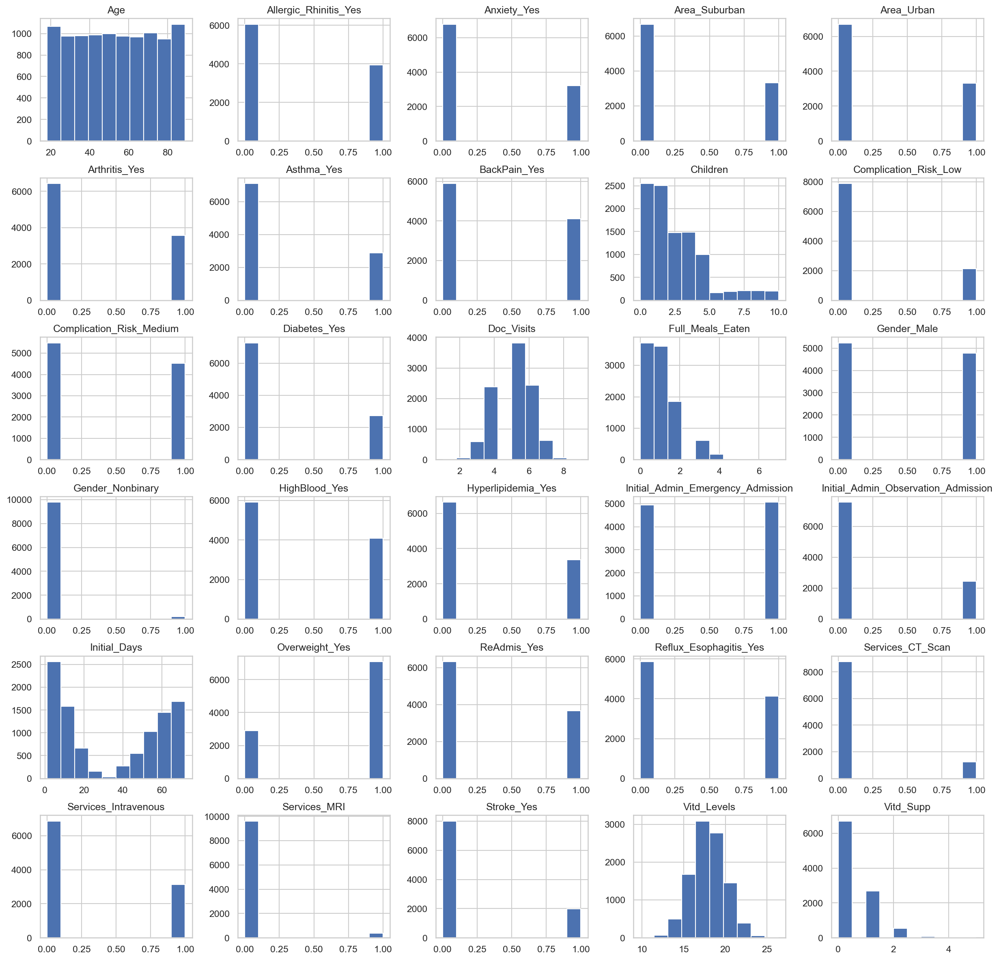

In [22]:
_ = df.hist(figsize=(20, 20))

### 2. Discuss the summary statistics, including the target variable and all predictor variables that you will need to gather from the data set to answer the research question.
*The submission accurately discusses the summary statistics and discusses the target variable and all predictor variables that need to be gathered from the data set to answer the selected research question.*

#### ✅ Target Variable
The target variable “Additional_Charges” shows a positively skewed distribution that becomes more uniform from \\$15,000 to \\$28,000 — this indicates most patients saw additional charges of \\$5,000 to \\$15,000. The distribution ranges from a minimum of \\$3125 to a maximum of \\$30,566 with a mean value of \\$12,934. Several patients paid significantly more additional charges, with outlier values ranging \\$27,000 and up. All 10,000 records had a non-null value for this variable.


In [23]:
pd.DataFrame({
    "counts": df[[TARGET_VAR]].value_counts(),
    "%": df[[TARGET_VAR]].value_counts(normalize=True) * 100
}).reset_index()

,ReAdmis_Yes,counts,%
0,0,6331,63.31
1,1,3669,36.69


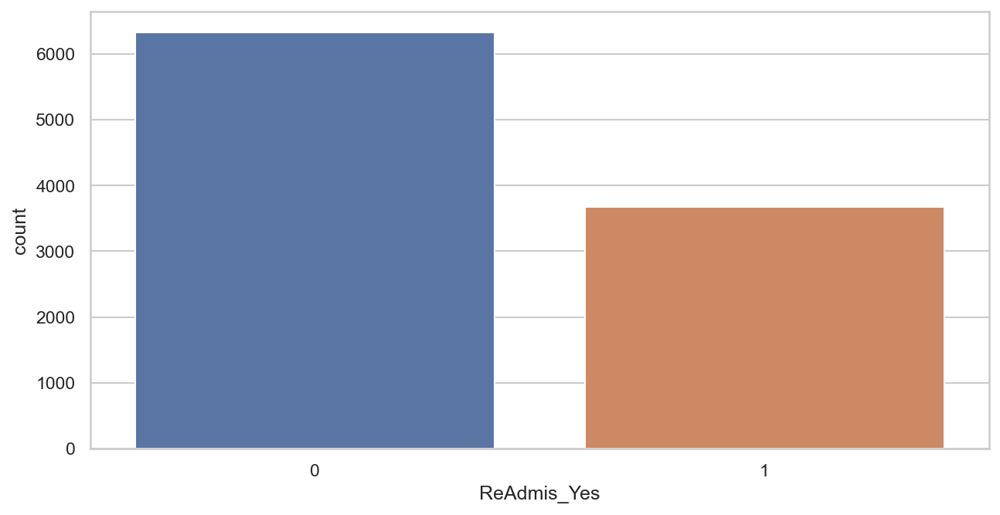

In [24]:
_, ax = plt.subplots(figsize = (10,5))

sns.countplot(data=df, x=TARGET_VAR)
plt.show()

#### ✅ Predictor Variables
The initial model includes nearly 40 data features, so we'll look at a few summary statistics and observations from these features. Each continuous or discrete value feature (Income, Population, Total Charges, Initial Days, Age) had significant standard deviations and variance compared to the categorical data features. All 10,000 records had a non-null value for each of these predictor variables. 

Each variable's distribution shape is also worth mentioning. Age was the only variable with a uniform distribution. Children, Marital_Separated, Vitd_Supp, Population and Initial_Admin_Emergency_Admission each have a positively skewed distribution. Income and Vitd_Levels both have a normal distribution. Lastly, Initial_Days and TotalCharge had multimodal distributions. Most of the categorical variables had positively skewed distributions. The two exceptions to this are Overweight_Yes, which had a negatively skewed distribution and Gender_Male, which had a mostly uniform distribution.


In [25]:
df.describe().T.sort_values("std", ascending=False)

,count,mean,std,min,25%,50%,75%,max
Initial_Days,10000.00,34.46,26.31,1.00,7.90,35.84,61.16,71.98
Age,10000.00,53.51,20.64,18.00,36.00,53.00,71.00,89.00
Children,10000.00,2.10,2.16,0.00,0.00,1.00,3.00,10.00
Vitd_Levels,10000.00,17.96,2.02,9.81,16.63,17.95,19.35,26.39
Doc_Visits,10000.00,5.01,1.05,1.00,4.00,5.00,6.00,9.00
Full_Meals_Eaten,10000.00,1.00,1.01,0.00,0.00,1.00,2.00,7.00
Vitd_Supp,10000.00,0.40,0.63,0.00,0.00,0.00,1.00,5.00
Initial_Admin_Emergency_Admission,10000.00,0.51,0.50,0.00,0.00,1.00,1.00,1.00
Gender_Male,10000.00,0.48,0.50,0.00,0.00,0.00,1.00,1.00
Complication_Risk_Medium,10000.00,0.45,0.50,0.00,0.00,0.00,1.00,1.00


In [26]:
pd.DataFrame(
    {"Range": df.max() - df.min(), "Variance": df.var(), "Std. Dev.": df.std()}
).sort_values(by="Std. Dev.", ascending=False)

,Range,Variance,Std. Dev.
Initial_Days,70.98,692.18,26.31
Age,71.00,425.95,20.64
Children,10.00,4.68,2.16
Vitd_Levels,16.59,4.07,2.02
Doc_Visits,8.00,1.09,1.05
Full_Meals_Eaten,7.00,1.02,1.01
Vitd_Supp,5.00,0.40,0.63
Initial_Admin_Emergency_Admission,1.00,0.25,0.50
Gender_Male,1.00,0.25,0.50
Complication_Risk_Medium,1.00,0.25,0.50


### 3.  Explain the steps used to prepare the data for the analysis, including the annotated code.
*The submission explains all necessary steps used to prepare the data for the analysis. The steps include the annotated code and relate to preparing for a logistic regression analysis.*



##### ✅  Drop Irrelevant Columns
To remove unneeded data features such as geographic information, survey responses, metadata, and IDs, we'll first create a list of data features that seem potentially relevant to the target variable. Then we'll subset the original data frame on that feature list. 

##### ✅ Drop Missing Values
We'll use pandas' isNull() function to determine which features — if any — have missing values. If we find these values we'll use the pandas.DataFrame.mean method to impute the missing values with that feature's mean value. We'll also use pandas.DataFrame.isna.sum to determine if certain features are missing a significant percentage of values. If we find these features, we'll use pandas.DataFrame.drop to remove the features.

##### ✅ Convert Object to Categorical Datatype
We'll use pandas.DataFrame.select_dtypes to select all nominal data features and then we'll use pandas.DataFrame.astype to convert these features into category data types

##### ✅ Convert categorical variables into dummy/indicator variables
We'll use pandas.get_dummies to convert categorical data features into one-hot encoded indicator variables.


### 4.  Generate univariate and bivariate visualizations of the distributions of variables in the cleaned data set. Include the target variable in your bivariate visualizations.
*The submission accurately generates both univariate and bivariate visualizations of the distributions of variables in the cleaned data set. The bivariate visualizations include the target variable.*


#### ✅ Univariate Visualizations

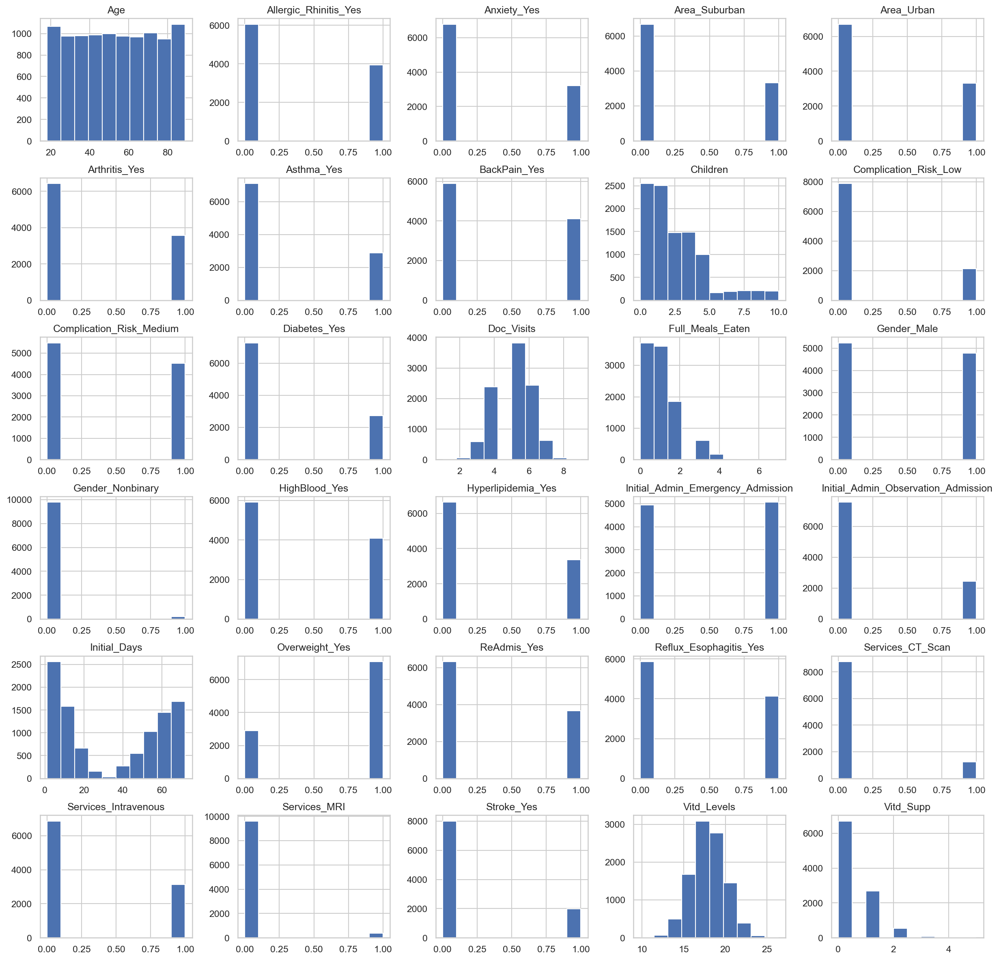

In [27]:
_ = df.hist(figsize=(20, 20))

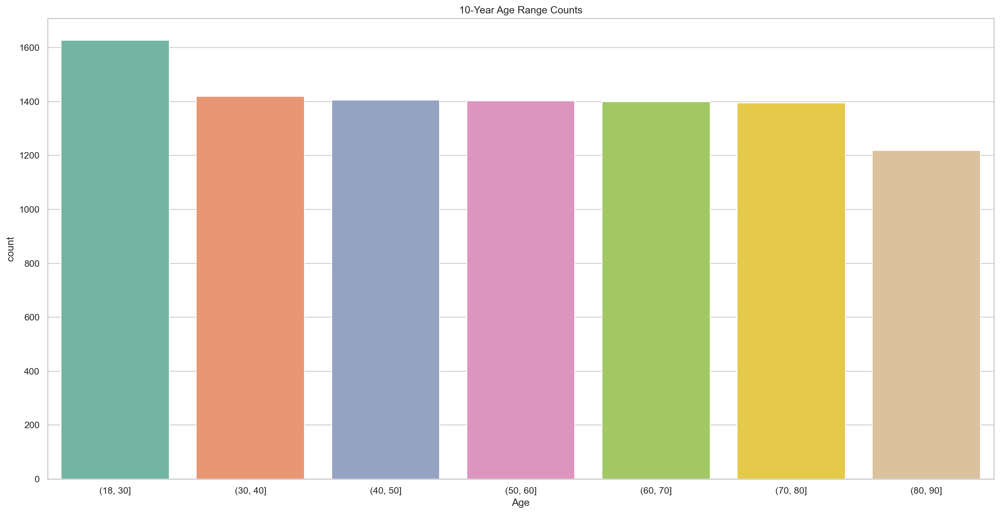

In [28]:
fig, axs = plt.subplots(figsize=(20,10))

age_bins = pd.cut(df.Age.round(0), precision=0, bins=[18, *range(30, 91, 10)])

_ = sns.countplot(x=age_bins, palette="Set2").set_title('10-Year Age Range Counts')

In [29]:
fig, axs = plt.subplots(nrows=len(df.columns), ncols=2, figsize=(30, 175))

for i, col in enumerate(df.columns):
    _ = sns.kdeplot(data=df.round(), x=col, shade=True, ax=axs[i, 0])

    # one-hot encoded categorical data features
    if (df[col].dtype == 'uint8'):
        _ = sns.countplot(data=df, x=col, ax=axs[i, 1])
    # continuous and discrete data features
    else:
        _ = sns.boxplot(data=df, x=col, ax=axs[i, 1])

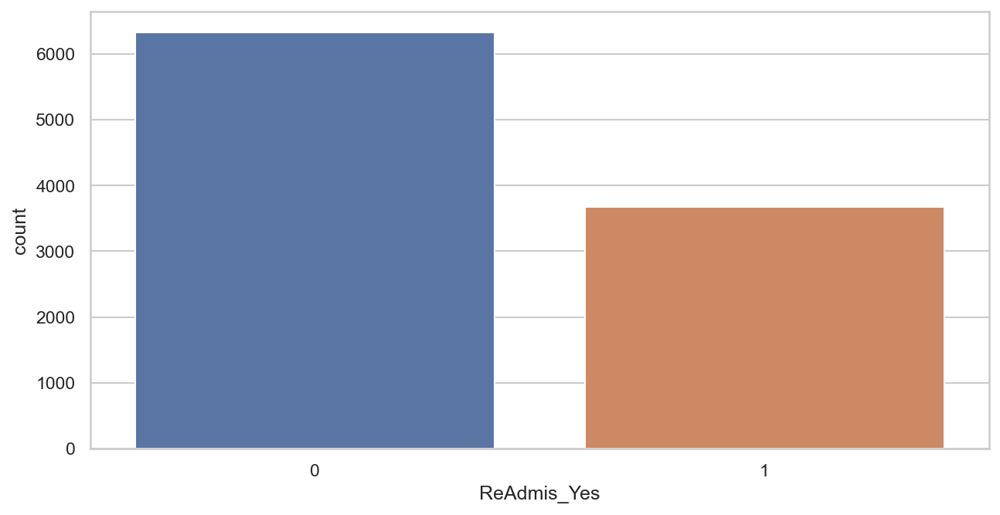

In [30]:
_, ax = plt.subplots(figsize = (10,5))

sns.countplot(data=df, x=TARGET_VAR)
plt.show()

#### Bivariate Visualizations

In [70]:
def create_heatmap(data, title="DataFrame Correlation Heatmap"):
    plt.figure(figsize=(50, 40))

    mask = np.triu(np.ones_like(data.corr(), dtype=bool))

    heatmap = sns.heatmap(data.corr(), mask=mask, vmin=-1, vmax=1, annot=True, annot_kws={'fontsize':24}, fmt='.2f')
    heatmap.set_xticklabels(heatmap.get_xmajorticklabels(), fontsize = 48)
    heatmap.set_yticklabels(heatmap.get_ymajorticklabels(), fontsize = 48)
    heatmap.set_title(title, fontdict={'fontsize':75}, pad=2);

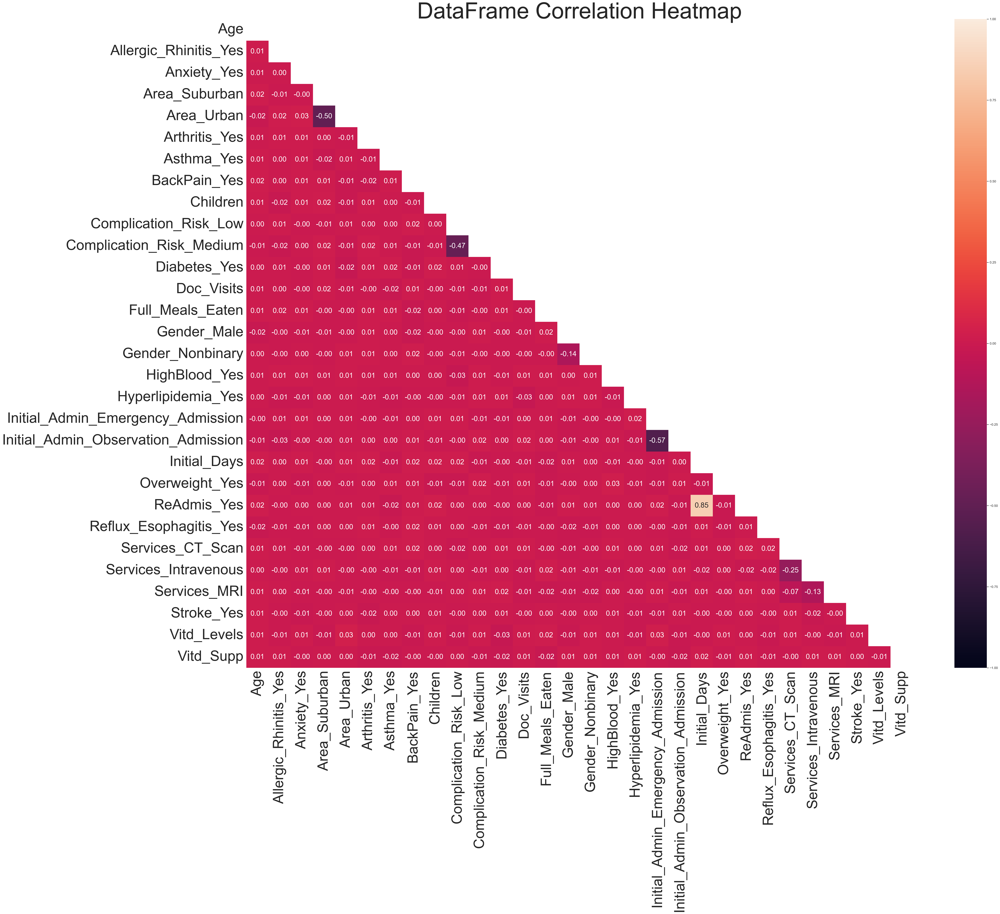

In [71]:
create_heatmap(df)

In [68]:
df.corr()

,Age,Allergic_Rhinitis_Yes,Anxiety_Yes,Area_Suburban,Area_Urban,Arthritis_Yes,Asthma_Yes,BackPain_Yes,Children,Complication_Risk_Low,Complication_Risk_Medium,Diabetes_Yes,Doc_Visits,Full_Meals_Eaten,Gender_Male,Gender_Nonbinary,HighBlood_Yes,Hyperlipidemia_Yes,Initial_Admin_Emergency_Admission,Initial_Admin_Observation_Admission,Initial_Days,Overweight_Yes,ReAdmis_Yes,Reflux_Esophagitis_Yes,Services_CT_Scan,Services_Intravenous,Services_MRI,Stroke_Yes,Vitd_Levels,Vitd_Supp
Age,1.00,0.01,0.01,0.02,-0.02,0.01,0.01,0.02,0.01,0.00,-0.01,0.00,0.01,0.01,-0.02,0.00,0.01,0.00,-0.00,-0.01,0.02,-0.01,0.02,-0.02,0.01,0.00,0.01,0.01,0.01,0.01
Allergic_Rhinitis_Yes,0.01,1.00,0.00,-0.01,0.02,0.01,0.00,0.00,-0.02,0.01,-0.02,0.01,0.00,0.02,-0.00,-0.00,0.01,-0.01,0.01,-0.03,0.00,0.00,-0.00,-0.01,0.01,-0.00,0.00,-0.00,-0.01,0.01
Anxiety_Yes,0.01,0.00,1.00,-0.00,0.03,0.01,0.01,0.01,0.01,-0.00,0.00,-0.00,-0.00,0.01,-0.01,0.00,0.01,-0.01,0.01,-0.00,0.01,-0.01,0.00,-0.01,-0.01,0.01,-0.01,-0.01,0.01,-0.00
Area_Suburban,0.02,-0.01,-0.00,1.00,-0.50,0.00,-0.02,0.01,0.02,-0.01,0.02,0.01,0.02,-0.00,-0.01,-0.00,0.01,0.00,0.00,-0.00,-0.00,0.00,0.00,0.00,-0.00,0.01,-0.00,-0.00,-0.01,0.00
Area_Urban,-0.02,0.02,0.03,-0.50,1.00,-0.01,0.01,-0.01,-0.01,0.01,-0.01,-0.02,-0.01,-0.00,-0.00,0.01,0.01,0.01,0.01,0.01,0.01,-0.01,0.01,0.00,-0.00,-0.00,-0.01,0.00,0.03,0.00
Arthritis_Yes,0.01,0.01,0.01,0.00,-0.01,1.00,-0.01,-0.02,0.01,0.00,0.02,0.01,-0.00,0.01,0.01,0.01,0.01,-0.01,-0.00,0.00,0.02,0.00,0.01,0.01,0.00,-0.00,-0.00,-0.02,0.00,-0.01
Asthma_Yes,0.01,0.00,0.01,-0.02,0.01,-0.01,1.00,0.01,0.00,0.00,0.01,0.02,-0.02,0.01,0.00,0.00,0.01,-0.01,-0.01,0.00,-0.01,0.01,-0.02,-0.00,0.01,-0.01,-0.00,0.00,0.00,-0.02
BackPain_Yes,0.02,0.00,0.01,0.01,-0.01,-0.02,0.01,1.00,-0.01,0.02,-0.01,-0.01,0.01,-0.02,-0.02,0.02,0.00,-0.00,0.00,0.01,0.02,0.01,0.01,0.02,0.02,-0.01,-0.00,0.00,-0.01,-0.00
Children,0.01,-0.02,0.01,0.02,-0.01,0.01,0.00,-0.01,1.00,0.00,-0.01,0.02,-0.00,0.00,-0.00,-0.00,0.00,-0.00,0.01,-0.01,0.02,-0.01,0.02,0.01,0.00,0.01,-0.01,0.01,0.01,-0.00
Complication_Risk_Low,0.00,0.01,-0.00,-0.01,0.01,0.00,0.00,0.02,0.00,1.00,-0.47,0.01,-0.01,-0.01,-0.00,-0.01,-0.03,-0.01,0.01,-0.00,0.02,-0.01,0.00,0.00,-0.02,0.00,0.00,-0.00,-0.01,0.00


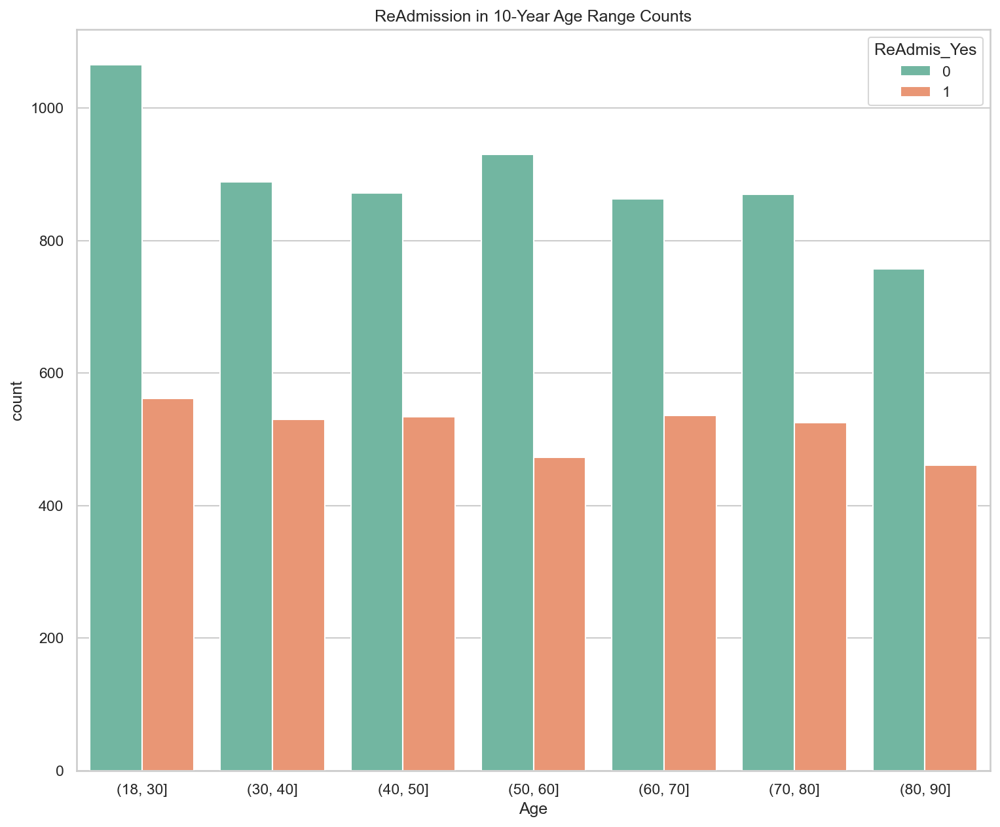

In [31]:
age_bins = pd.cut(df.Age.round(0), precision=0, bins=[18, *range(30, 91, 10)])

_ = sns.countplot(x=age_bins, hue=TARGET_VAR, palette="Set2", data=df).set_title('ReAdmission in 10-Year Age Range Counts')

#### Categorical Plots

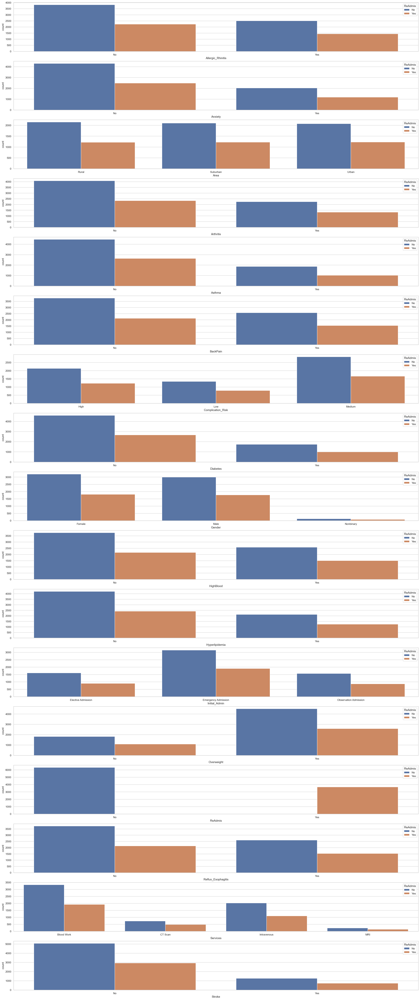

In [51]:
ctg_cols = prep_df.select_dtypes("category").columns
fig, axs = plt.subplots(nrows=len(ctg_cols), figsize=(30, 75))

for i, col in enumerate(ctg_cols):
    sns.countplot(data=prep_df, x=col, hue="ReAdmis", ax=axs[i])

##### Total Charge vs ReAdmission

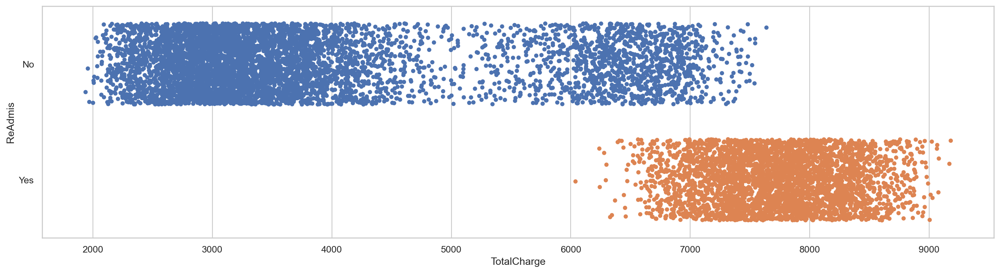

In [131]:
fig, axs = plt.subplots(figsize=(20, 5))

_ = sns.stripplot(y="ReAdmis", x="TotalCharge", data=prep_df, jitter=0.35)

##### Population Size vs ReAdmission

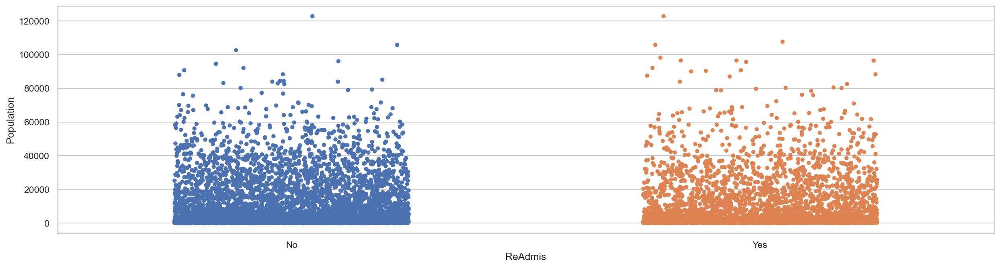

In [122]:
fig, axs = plt.subplots(figsize=(20, 5))
_ = sns.stripplot(x="ReAdmis", y="Population", data=prep_df, jitter=0.25)

##### Area Type + Population vs ReAdmission

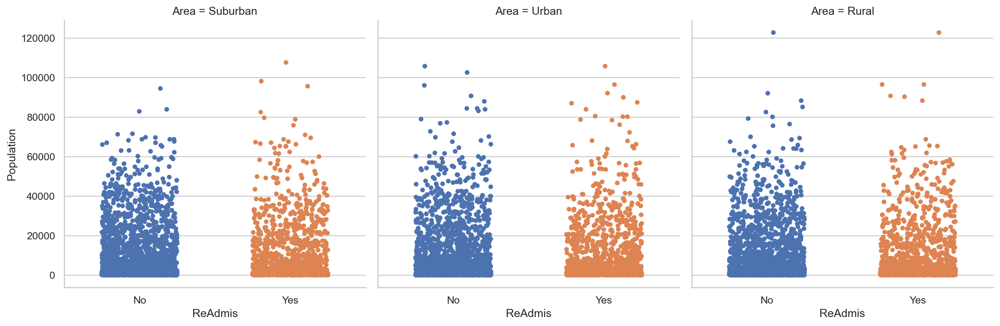

In [121]:
_ = sns.catplot(x="ReAdmis", y="Population", col="Area", data=prep_df, jitter=0.25)

##### Gender + Population vs ReAdmission

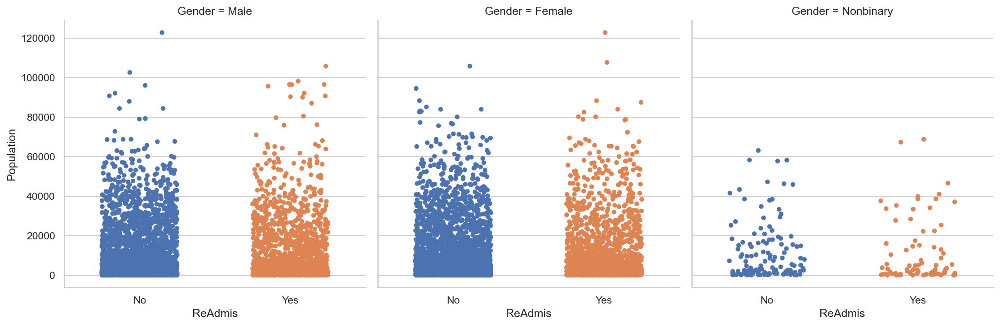

In [120]:
_ = sns.catplot(x="ReAdmis", y="Population", col="Gender", data=prep_df, jitter=0.25)

##### Number of Children + Population vs ReAdmission

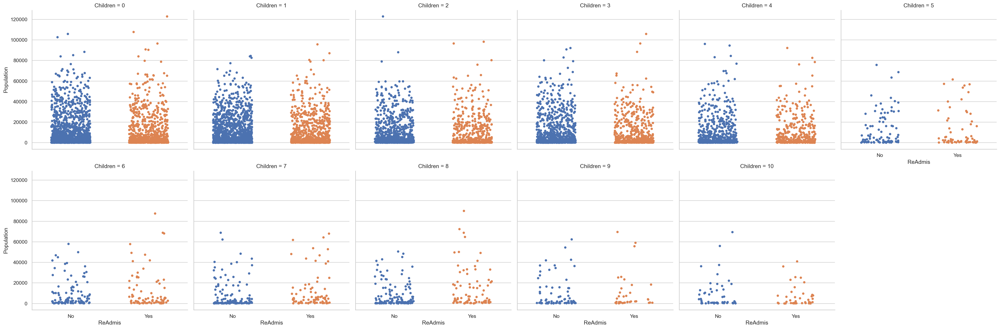

In [119]:
_ = sns.catplot(x="ReAdmis", y="Population", col="Children", data=prep_df, col_wrap=6, jitter=0.25)

##### Area Type + Population vs ReAdmission by Gender

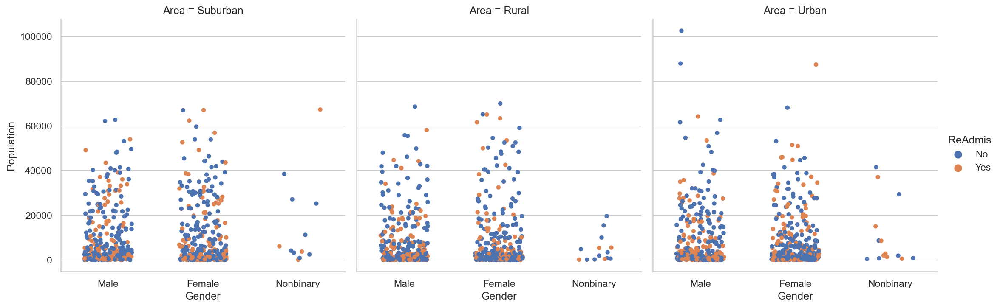

In [115]:
_ = sns.catplot(x="Gender", y="Population", hue="ReAdmis", col="Area", data=prep_df.sample(n=2000), jitter=0.25)

##### Gender + Population vs ReAdmission Swarmplot

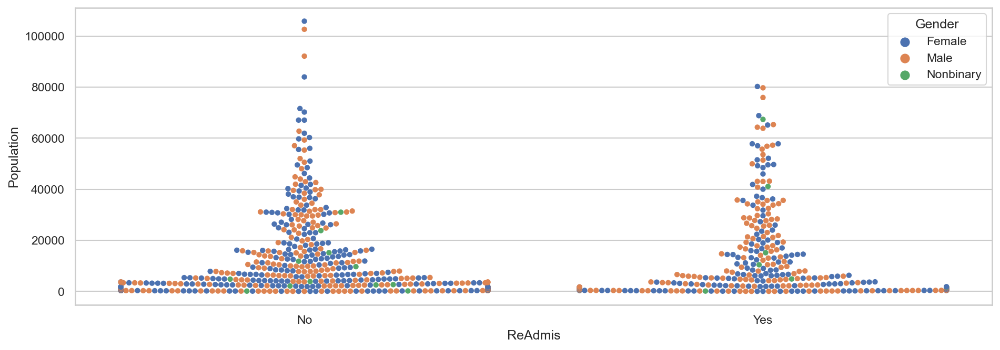

In [114]:
fig, axs = plt.subplots(figsize=(15, 5))
ax = sns.swarmplot(x="ReAdmis", y="Population", hue="Gender", data=prep_df.sample(n=1000))

##### Gender + Initial Days vs ReAdmission Boxplot

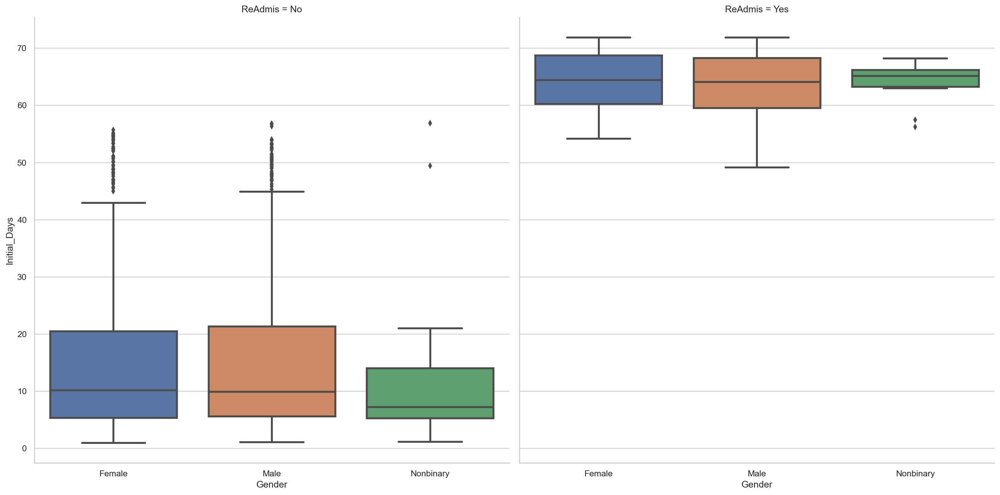

In [98]:
sns.catplot(x="Gender", y="Initial_Days", col="ReAdmis", kind="box", data=prep_df.sample(n=1000), height=9)


##### Vitamin D Levels vs ReAdmission Stripplot

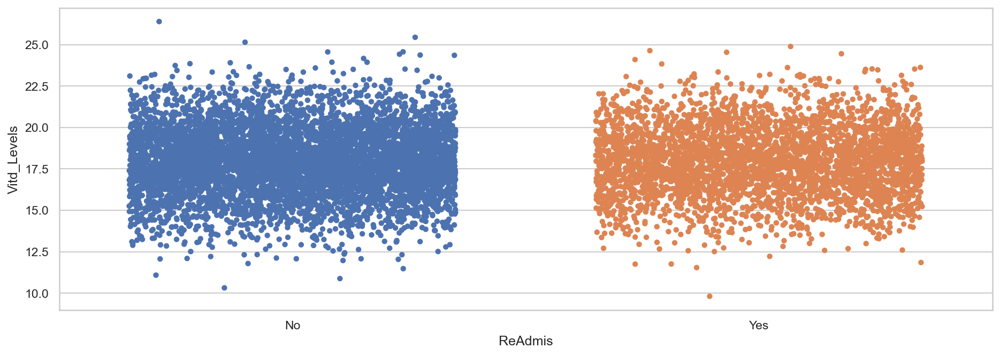

In [109]:
fig, axs = plt.subplots(figsize=(15, 5))
_ = sns.stripplot(x="ReAdmis", y="Vitd_Levels", data=prep_df, jitter=0.35)

##### Initial Days vs ReAdmission Stripplot

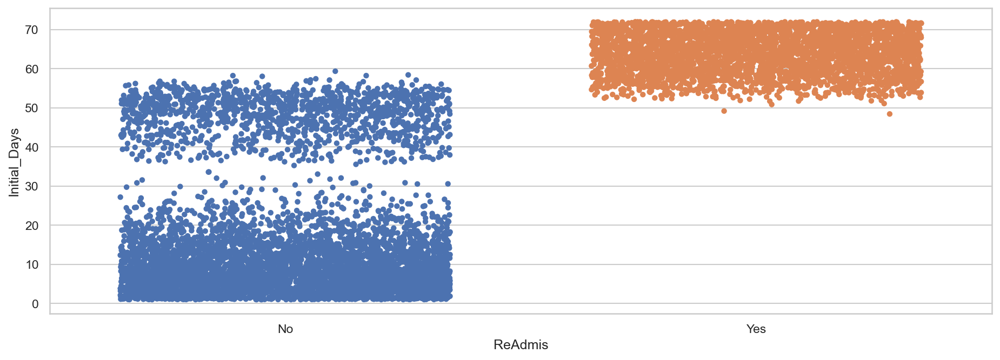

In [107]:
fig, axs = plt.subplots(figsize=(15, 5))
_ = sns.stripplot(x="ReAdmis", y="Initial_Days", data=prep_df, jitter=0.35)

##### Case Order vs ReAdmission Stripplot

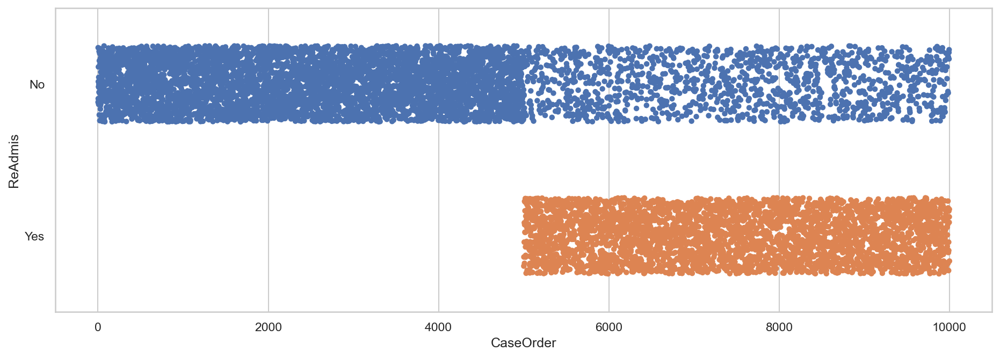

In [134]:
fig, axs = plt.subplots(figsize=(15, 5))
_ = sns.stripplot(y="ReAdmis", x="CaseOrder",  data=original_df, jitter=0.25)

### 5.  ✅ Provide a copy of the prepared data set.
*The submission provides a copy of the fully prepared data set.*



In [135]:
df.to_csv("./src/medical_prepared_logistic_regression.csv")

# Part IV: Model Comparison and Analysis
---

## D.  Compare an initial and a reduced logistic regression model by doing the following:



### 1.  Construct an initial logistic regression model from all predictors that were identified in Part C2.
*The submission provides an accurate initial logistic regression model from all predictors identified in Part C2.*


In [ ]:
def print_OLS_results(model):
    rnd = lambda v: v.round(3)
    
    print("AIC", rnd(model.aic))
    print("R-Squared", rnd(model.rsquared))
    print("R-Squared Adjusted", rnd(model.rsquared_adj))    
    print("Mean-Squared Error:", rnd(model.mse_resid))
    print("Residual Standard Error:", rnd(np.sqrt(model.mse_resid)), end="\n\n")        
    print(model.summary())    

def get_OLS_summary(data, x_columns, y_column, output=True, qq_output=True):
    x = data[x_columns]
    y = data[y_column]
    x = sm.add_constant(x)
    results = sm.OLS(y, x).fit()
    
    if qq_output:
        _ = qqplot(data=results.resid, fit=True, line="45")    

    if output:
        print_OLS_results(results)
        
    return results, x
    
def explanatory_vars(data, target_var):
    return data.columns[~data.columns.isin([target_var])] 

#### Model With All Relevant Data Features
```
                            OLS Regression Results                            
==============================================================================
Dep. Variable:     Additional_Charges   R-squared:                       0.939
Model:                            OLS   Adj. R-squared:                  0.938
Method:                 Least Squares   F-statistic:                     4016.
Date:                Wed, 04 May 2022   Prob (F-statistic):               0.00
Time:                        21:11:00   Log-Likelihood:                -88087.
No. Observations:               10000   AIC:                         1.763e+05
Df Residuals:                    9961   BIC:                         1.765e+05
Df Model:                          38                                         
Covariance Type:            nonrobust    
```

#### Log Score

In [ ]:
stars = "*" * 20

logreg = LogisticRegression()
logreg.fit(x_train, y_train)
y_pred=logreg.predict(x_test)
y_train_pred=logreg.predict(x_train)

logreg.score

print(f"\n{stars} TRAINING DATA {stars}")
print(logreg.score(x_train, y_train))

print(f"\n{stars} TEST DATA {stars}")
print(logreg.score(x_test, y_test))

In [ ]:
%%time
# target_var = 'Additional_Charges'

# all_relevant_x_columns = explanatory_vars(df, target_var)
# all_model, all_model_x = get_OLS_summary(df, all_relevant_x_columns, target_var)

# Fit a logistic regression of churn vs. length of relationship using the churn dataset
all_mdl = logit(
    "has_churned ~ time_since_first_purchase", data=churn
).fit()

# Print the parameters of the fitted model
print(all_mdl.params)


#### Prediction Data

In [ ]:
mdl_churn_vs_relationship = logit(
    "has_churned ~ time_since_first_purchase", data=churn
).fit()

explanatory_data = pd.DataFrame(
    {
        "time_since_first_purchase": {
            "0": -1.5,
            "1": -1.25,
            "2": -1.0,
            "3": -0.75,
            "4": -0.5,
            "5": -0.25,
            "6": 0.0,
            "7": 0.25,
            "8": 0.5,
            "9": 0.75,
            "10": 1.0,
            "11": 1.25,
            "12": 1.5,
            "13": 1.75,
            "14": 2.0,
            "15": 2.25,
            "16": 2.5,
            "17": 2.75,
            "18": 3.0,
            "19": 3.25,
            "20": 3.5,
            "21": 3.75,
            "22": 4.0,
        }
    }
)

# Create prediction_data
prediction_data = explanatory_data.assign(
    has_churned=mdl_churn_vs_relationship.predict(explanatory_data)
)

# Print the head
print(prediction_data.head())

churn.head()


In [ ]:
# Create prediction_data
prediction_data = explanatory_data.assign(
    has_churned=mdl_churn_vs_relationship.predict(explanatory_data)
)

fig = plt.figure()

# Create a scatter plot with logistic trend line
sns.regplot(
    y="has_churned", x="time_since_first_purchase", data=churn, logistic=True, ci=None
)

# Overlay with prediction_data, colored red
sns.scatterplot(
    y="has_churned",
    x="time_since_first_purchase",
    data=prediction_data,
    ci=None,
    color="red",
)

plt.show()



#### Confusion Matrix

In [ ]:
from statsmodels.graphics.mosaicplot import mosaic

# Calculate the confusion matrix conf_matrix
conf_matrix = mdl_churn_vs_relationship.pred_table()

# Print it
print(conf_matrix)

# Draw a mosaic plot of conf_matrix
mosaic(conf_matrix)
plt.show()

In [ ]:
print(conf_matrix)
# Extract TN, TP, FN and FP from conf_matrix
TN = conf_matrix[0][0]
TP = conf_matrix[1][1]
FN = conf_matrix[1][0]
FP = conf_matrix[0][1]

# Calculate and print the accuracy
accuracy = (TN + TP) / (TN + FN + FP + TP)
print("accuracy: ", accuracy)

# Calculate and print the sensitivity
sensitivity = TP / (TP + FN)
print("sensitivity: ", sensitivity)

# Calculate and print the specificity
specificity = TN / (TN + FP)
print("specificity: ", specificity)


#### Visualizing Confusion Matrix using Heatmap

In [ ]:
def create_conf_matrix(y_test, y_pred):
    c_matrix = metrics.confusion_matrix(y_test, y_pred)
    rnd = lambda v: v.round(3)
    
    sns.heatmap(pd.DataFrame(c_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
    plt.title('Confusion matrix', y=1.1)
    plt.ylabel('Actual label')
    plt.xlabel('Predicted label') 
    
    print("Accuracy:",rnd(metrics.accuracy_score(y_test, y_pred)))
    print("Precision:", rnd(metrics.precision_score(y_test, y_pred)))
    print("Recall:", rnd(metrics.recall_score(y_test, y_pred)))    
    
create_conf_matrix(y_train, y_train_pred)
plt.show()
create_conf_matrix(y_test, y_pred)
plt.show()

#### log_odds_ratio vs. target var

#### np.log(log_odds_ratio) vs. target var

#### most likely outcome

#### linear regression line with logistic trend line

#### sns.displot

### 2.  Justify a statistically based variable selection procedure and a model evaluation metric to reduce the initial model in a way that aligns with the research question.
*The submission justifies a statistically based variable selection procedure and a model evaluation metric to reduce the initial model. The justification is in alignment with the research question.*

The main difference is that instead of using the change of R2 to measure the difference in fit between an equation with or without a particular variable, you use the change in likelihood. Otherwise, everything about choosing variables for multiple linear regression applies to multiple logistic regression as well, including the warnings about how easy it is to get misleading results (http://www.biostathandbook.com/multiplelogistic.html). 



#### [ ] cumulative gains curve
The cumulative gains curve is an evaluation curve that assesses the performance of your model. It shows the percentage of targets reached when considering a certain percentage of your population with the highest probability to be target according to your model.

To construct this curve, you can use the .plot_cumulative_gain() method in the scikitplot module and the matplotlib.pyplot module. As for each model evaluation metric or curve, you need the true target values on the one hand and the predictions on the other hand to construct the cumulative gains curve.

In [ ]:
# Import the scikitplot module
import scikitplot as skplt

# Plot the cumulative gains graph
skplt.metrics.plot_cumulative_gain(targets_test, predictions_test)
plt.show()

#### [ ] Lift Curve
The lift curve is an evaluation curve that assesses the performance of your model. It shows how many times more than average the model reaches targets.

To construct this curve, you can use the plot_lift_curve method in the scikitplot module and the matplotlib.pyplot module. As for each model evaluation metric or curve, you need the true target values on the one hand and the predictions on the other hand to construct the cumulative gains curve.

In [ ]:
# Import the scikitplot module
import scikitplot as skplt

# Plot the lift curve
skplt.metrics.plot_lift_curve(targets_test, predictions_test)
plt.show()


#### [ ] AUC / ROC

In [ ]:
### ROC Curve ####
y_pred_proba = logreg.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
auc = metrics.roc_auc_score(y_test, y_pred_proba)
plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.show()

In [ ]:
# Create appropriate dataframes
X_1 = basetable[variables_1]
X_2 = basetable[variables_2]
y = basetable[["target"]]

# Create the logistic regression model
logreg = linear_model.LogisticRegression()

# Make predictions using the first set of variables and assign the AUC to auc_1
logreg.fit(X_1, y)
predictions_1 = logreg.predict_proba(X_1)[:,1]
auc_1 = roc_auc_score(y, predictions_1)

# Make predictions using the second set of variables and assign the AUC to auc_2
logreg.fit(X_2, y)
predictions_2 = logreg.predict_proba(X_2)[:,1]
auc_2 = roc_auc_score(y, predictions_2)

# Print auc_1 and auc_2
print(round(auc_1,2))
print(round(auc_2,2))

In [ ]:
"""
Building the AUC curves
The forward stepwise variable selection procedure provides an order in which variables are optimally added to the predictor set. In order to decide where to cut off the variables, you can make the train and test AUC curves. These curves plot the train and test AUC using the first, first two, first three, … variables in the model.

In this exercise you will learn to plot these AUC curves. The method auc_train_test to calculate the AUC values has been implemented for you and can be used as follows:

auc_train, auc_test = auc_train_test(variables, target, train, test)
where variables is the set of variables used in the logistic regression model, target is a list with the target name, and train and test are the train and test basetable respectively.

The variables ordered according to the forward stepwise procedure are given in the list variables. You can explore it in the console. Additionally, three empty lists have been defined for you:

auc_values_train, which will contain the train AUC values of the model at each iteration
auc_values_test, which will contain the test AUC values of the model at each iteration
variables_evaluate, which will contain the variables evaluated at each iteration
"""

# Keep track of train and test AUC values
auc_values_train = []
auc_values_test = []
variables_evaluate = []

variables = ['max_gift', 'time_since_last_gift', 'number_gift', 'mean_gift', 'income_high', 'age', 'gender_F', 'time_since_first_gift', 'income_low', 'country_UK']


# Iterate over the variables in variables
for v in variables:
  
    # Add the variable
    variables_evaluate.append(v)
    
    # Calculate the train and test AUC of this set of variables
    auc_train, auc_test = auc_train_test(variables_evaluate, ["target"], train, test)
    
    # Append the values to the lists
    auc_values_train.append(auc_train)
    auc_values_test.append(auc_test)
    
# Make plot of the AUC values
import matplotlib.pyplot as plt
import numpy as np

x = np.array(range(0,len(auc_values_train)))
y_train = np.array(auc_values_train)
y_test = np.array(auc_values_test)
plt.xticks(x, variables, rotation = 90)
plt.plot(x,y_train)
plt.plot(x,y_test)
plt.ylim((0.6, 0.8))
plt.show()

#### [ ] Variance Inflation Factor (VIF) / Multicollinearity
Variance inflation factor (VIF) measures the amount of multicollinearity within multiple regression variables. Calculating the VIF for each explanatory variable and filtering out variables with a high VIF is a way to reduce variables. Like correlation, multicollinearity indicates a given variable is not necessary for the model because one or more other variables in the model already provide similar information. Our initial model summary indicated in the footnotes that there was strong multicollinearity present. Calculating VIF for our current variables indicates we can safely remove the TotalCharge and Initial_Days variables since their VIF values are well above 10.

```
                            OLS Regression Results                            
==============================================================================
Dep. Variable:     Additional_Charges   R-squared:                       0.939
Model:                            OLS   Adj. R-squared:                  0.938
Method:                 Least Squares   F-statistic:                     4237.
Date:                Wed, 04 May 2022   Prob (F-statistic):               0.00
Time:                        21:26:49   Log-Likelihood:                -88091.
No. Observations:               10000   AIC:                         1.763e+05
Df Residuals:                    9963   BIC:                         1.765e+05
Df Model:                          36                                         
Covariance Type:            nonrobust    
```

In [84]:
def create_vif_dataframe(data, target_var, x_cols):
    # x_columns = explanatory_vars(df, target_var)

    VIFS = {col: variance_inflation_factor(df[x_cols].values, i).round(3) for i, col in enumerate(x_cols)}   

    VIF_df = pd.DataFrame({'Feature': VIFS.keys(), 'VIF': VIFS.values()}).sort_values(by="VIF", ascending=False)
    VIF_df.style.hide_index()
    
    return VIF_df

def filter_high_vif_features(VIF_data, VIF_threshold=5):
    low_collinearity_df = VIF_data[VIF_data.VIF < VIF_threshold]
    
    return low_collinearity_df.Feature.sort_values().values

In [86]:
vif_df_1 = create_vif_dataframe(df, y_col, x_cols)
vif_df_1

,Feature,VIF
27,Vitd_Levels,31.92
12,Doc_Visits,19.93
0,Age,7.39
21,Overweight_Yes,3.39
18,Initial_Admin_Emergency_Admission,2.98
20,Initial_Days,2.69
10,Complication_Risk_Medium,2.32
13,Full_Meals_Eaten,1.99
3,Area_Suburban,1.98
4,Area_Urban,1.98


In [89]:
low_collinearity_x_cols = filter_high_vif_features(vif_df_1, VIF_threshold=5)

low_collinearity_df = df[y_col]
low_collinearity_df

get_OLS_summary(low_collinearity_df, low_collinearity_x_cols, target_var)

NameError: name 'get_OLS_summary' is not defined

In [ ]:
vif_df_2 = create_vif_dataframe(df[low_collinearity_x_cols])
vif_df_2

#### Recursive Feature Elimination (RFE)
Recursive Feature Elimination (RFE) selects data features that are the most relevant in predicting the target variable (Brownlee, 2020). RFE is also useful because we can specify the number of features to retain and the selection criteria. Additionally, RFE will evaluate numerous combinations of variables with very little work required — writing code that could replicate this would be time-consuming and error-prone. Using this approach with a Ridge Regression estimator tells us we can start by narrowing down our variable count to 6 from 38.

In [ ]:
def plot_feature_cross_val_scores(min_num_features, model):
    plt.plot(
        range(min_num_features, len(model.grid_scores_) + min_num_features),
        model.grid_scores_,
    )
    
    plt.xlabel("# Selected Features")
    plt.ylabel("Cross Validation Score (Accuracy)")    
    plt.show()

#### Recursive Feature Elimination + Cross Validation (Ridge Regression Estimator)

In [ ]:
%%time

X, y = df[explanatory_vars(df, "Additional_Charges")], df.Additional_Charges
ridge = RidgeCV()
rfecv = RFECV(estimator=ridge, min_features_to_select=1, step=1).fit(X, y)

selected_features = rfecv.get_support()

display("Selected Features", list(X.columns[selected_features]))
plot_feature_cross_val_scores(min_num_features=1, model=rfecv)

#### Recursive Feature Elimination + Cross Validation (Linear Regression Estimator)

In [ ]:
%%time

X, y = df[explanatory_vars(df, "Additional_Charges")], df.Additional_Charges
reg = LinearRegression()
rfecv = RFECV(estimator=reg, min_features_to_select=1, step=1).fit(X, y)

selected_features = rfecv.get_support()

display("Selected Features", list(X.columns[selected_features]))
plot_feature_cross_val_scores(min_num_features=1, model=rfecv)

#### Sequential Forward Selection (Ridge Regression)
Like RFE, Sequential Forward Selection (SFS) is another method to iteratively select explanatory variables if there's evidence that the newly added variables improve the model. If the new variables add little to no value to the model, then the variable is removed from the list. Using this approach with a Ridge Regression estimator tells us we can start by narrowing down our variable count to 6 from 38.

In [ ]:
%%time

X, y = df[explanatory_vars(df, "Additional_Charges")], df.Additional_Charges
ridge = RidgeCV().fit(X, y)

sfs = SequentialFeatureSelector(ridge, n_features_to_select=6, direction="forward").fit(X, y)

selected_features = sfs.get_support()

display("Selected Features", list(X.columns[selected_features]))

#### Sequential Forward Selection (Linear Regression)

In [ ]:
%%time

X, y = df[explanatory_vars(df, "Additional_Charges")], df.Additional_Charges
reg = LinearRegression().fit(X, y)

sfs = SequentialFeatureSelector(reg, n_features_to_select=15, direction="forward").fit(X, y)

selected_features = sfs.get_support()

display("Selected Features", list(X.columns[selected_features]))

#### Sequential Forward Selection (ElasticNet)

In [ ]:
%%time

X, y = df[explanatory_vars(df, "Additional_Charges")], df.Additional_Charges
ridge = ElasticNet().fit(X, y)

sfs = SequentialFeatureSelector(ridge, n_features_to_select=6, direction="forward").fit(X, y)

selected_features = sfs.get_support()

display("Selected Features", list(X.columns[selected_features]))


#### Lasso Linear Model Feature Importance
Least Absolute Shrinkage and Selection Operator (LASSO) is a statistical formula for the regularization of data models and feature selection to avoid overfitting of the data (Great Learning Team, 2022). LASSO effectively shrinks the less important feature’s coefficient to zero, which removes the feature from the model (Stephanie & Statistics How To, 2020). LASSO recommended that we reduce our model to three explanatory variables.

In [ ]:
X, y = df[explanatory_vars(df, "Additional_Charges")], df.Additional_Charges

reg = LassoCV()
reg.fit(X, y)

print("Best alpha using built-in LassoCV:", reg.alpha_)
# coefficient of determination of the prediction.
print("Best score using built-in LassoCV:", reg.score(X,y))
# The amount of penalization chosen by cross validation.
coef = pd.Series(reg.coef_, index = X.columns)

num_selected_vars = sum(abs(coef) > 0)

print(f"Lasso selected {num_selected_vars} variables and eliminated { sum(abs(coef) == 0) } variables")

imp_coef = coef.sort_values()
imp_coef = pd.DataFrame(imp_coef, columns=["Feature Importance"])
imp_coef.reset_index(inplace=True)
imp_coef = imp_coef.rename(columns = {'index':'Feature'})

barplot = sns.barplot(data=imp_coef, y="Feature", x="Feature Importance", orient="h")
barplot.set_title("Lasso Model Feature Importance")

imp_coef[abs(imp_coef["Feature Importance"]) > 1]

#### Sequential Backward Selection (Ridge Regression)

In [ ]:
X, y = df[explanatory_vars(df, "Additional_Charges")], df.Additional_Charges
ridge = RidgeCV().fit(X, y)

sfs = SequentialFeatureSelector(ridge, n_features_to_select=6, direction="backward").fit(X, y)

selected_features = sfs.get_support()

display("Selected Features", list(X.columns[selected_features]))

### 3.  Provide a reduced logistic regression model that includes both categorical and continuous variables. (Note: The output should include a screenshot of each model.)
*The submission provides a reduced logistic regression model, and the model is in alignment with the justification from part D2.*



In [ ]:
%%time
target_var = 'Additional_Charges'

final_x_columns = ['Age','HighBlood_Yes','Initial_Admin_Emergency_Admission','Stroke_Yes']

final_model, final_model_x = get_OLS_summary(df, final_x_columns, target_var)

## E.  Analyze the data set using your reduced logistic regression model by doing the following:



### 1.  Explain your data analysis process by comparing the initial and reduced logistic regression models, including the following elements:
*The submission accurately explains the data analysis process by comparing the initial and reduced logistic regression models, including all of the given elements.*

- the logic of the variable selection technique

- the model evaluation metric

- a residual plot

#### A. the logic of the variable selection technique
The initial model didn't include any statistic-based variable selection techniques. Features were selected based on data that seemed related to the target variable. Additionally, many features that served as metadata were removed. The reduced model used multiple techniques to select four explanatory variables: Age, High Blood Pressure, Emergency Hospital Admission, and Stroke Incidence. VIF, RFE, SFS, Ridge Regression, and LASSO Regression were all referenced to validate that the selected four variables were appropriate. The reduced model calculated a high R-Squared value and low P-values for each coefficient, so all four explanatory variables were included in the final model.

#### B. the model evaluation metric

The model evaluation metric for both the initial and reduced models was R-Squared and Adjusted R-Squared. These values measured how much of the data variance was explained by the model, as expressed in the spread of the residuals. The Adjusted R-Squared is simply R-Square adjusted for the number of explanatory variables in the model. The goal was to find values that were close to 1 and close to each other. The reduced model had an R-Squared and Adjusted R-Squared of 0.937 whereas the initial model had 0.939 and 0.938 respectively.

#### Predictor insight graphs
The predictor insight graph table contains all the information needed to construct the predictor insight graph. For each value the predictor takes, it has the number of observations with this value and the target incidence within this group. The predictor insight graph table of the predictor Country is loaded as a pandas object pig_table. You can access elements using indexing. For instance, to retrieve the target incidence of donors living in the UK, you can use:

pig_table["Incidence"][pig_table["Country"]=="UK"]


#### C. a residual plot

In [ ]:
sample_df = df.sample(n=100, random_state=0)

# print(sample_df.head().T)
# print(list(original_df.columns))

reg_plot_model = ols('Additional_Charges ~ Income + Age + HighBlood_Yes + Initial_Admin_Emergency_Admission + Stroke_Yes', data=sample_df).fit()

selected_features = list(final_model.params.keys()[1:])

for feature in selected_features:
    _ = sm.graphics.plot_regress_exog(reg_plot_model, feature, fig=plt.figure(figsize=(12,8)))

### 2.  Provide the output and any calculations of the analysis you performed, including the model’s residual error. (Note: The output should include the predictions from the refined model you used to perform the analysis.)
*The submission provides the accurate output and calculations of the analysis performed, including a confusion matrix. The submissions includes all necessary output and calculations.*
<br />*Your model will be a mathematical formula that can be used to predict your dependent variable. The note is asking you to provide the output from that prediction. A sample output of 10 to 20 rows of data should be sufficient.*



#### Original Model Summary

In [ ]:
# create a sample prediction to see what the initial model predicts
explanatory_sample_data = df.sample(n=1).to_dict(orient="records")

sample_obs = pd.DataFrame([{ "intercept": 1,
  'Age': 21,
  'Allergic_Rhinitis_Yes': 0,
  'Anxiety_Yes': 0,
  'Area_Suburban': 0,
  'Area_Urban': 1,
  'Arthritis_Yes': 0,
  'Asthma_Yes': 1,
  'BackPain_Yes': 1,
  'Children': 0,
  'Complication_Risk_Low': 0,
  'Complication_Risk_Medium': 0,
  'Diabetes_Yes': 0,
  'Doc_Visits': 5,
  'Full_Meals_Eaten': 1,
  'Gender_Male': 0,
  'Gender_Nonbinary': 0,
  'HighBlood_Yes': 1,
  'Hyperlipidemia_Yes': 0,
  'Income': 41027.79,
  'Initial_Admin_Emergency_Admission': 0,
  'Initial_Admin_Observation_Admission': 1,
  'Initial_Days': 2.238857388,
  'Marital_Married': 1,
  'Marital_Never_Married': 0,
  'Marital_Separated': 0,
  'Marital_Widowed': 0,
  'Overweight_Yes': 0,
  'Population': 50895,
  'ReAdmis_Yes': 0,
  'Reflux_Esophagitis_Yes': 1,
  'Services_CT_Scan': 0,
  'Services_Intravenous': 0,
  'Services_MRI': 0,
  'Soft_Drink_Yes': 1,
  'Stroke_Yes': 0,
  'TotalCharge': 2709.776623,
  'Vitd_Levels': 18.93928527,
  'Vitd_Supp': 1}])

all_model.predict(sample_obs)

#### Original Model Predictions

In [ ]:
explanatory_sample_data = all_model_x.sample(n=15)

predicted_additional_charges = all_model.predict(explanatory_sample_data)
prediction_data = explanatory_sample_data.assign(PredictedAdditionalCharges=predicted_additional_charges)
prediction_data.sort_values("PredictedAdditionalCharges", ascending=False).T

#### Reduced Model Summary

In [ ]:
print_OLS_results(final_model)

#### Reduced Model Predictions

In [ ]:
explanatory_sample_data = final_model_x.sample(n=15)

predicted_additional_charges = final_model.predict(explanatory_sample_data)
prediction_data = explanatory_sample_data.assign(PredictedAdditionalCharges=predicted_additional_charges)
prediction_data.sort_values("PredictedAdditionalCharges", ascending=False).T

In [ ]:
# This function will regress y on x (possibly as a robust or polynomial regression) and then draw a scatterplot of the residuals. You can optionally fit a lowess smoother to the residual plot, which can help in determining if there is structure to the residuals.
_ = sns.residplot(
    x="Age", y="Additional_Charges", data=df, lowess=True
)

plt.xlabel("Fitted Values (Age)")
plt.ylabel("Residuals")

plt.show()

In [ ]:
# Create the Q-Q plot of the residuals
qqplot(data=all_model.resid, fit=True, line="45")

plt.show()

### 3.  Provide the code used to support the implementation of the logistic regression models.
*The submission provides the code used to support the implementation of the logistic regression models, and the code is complete and accurate.*


# Part V: Data Summary and Implications
---


## F.  Summarize your findings and assumptions by doing the following:



### 1.  Discuss the results of your data analysis, including the following elements:
*The submission accurately discusses the results of the data analysis, and the discussion addresses all of the given elements and is in alignment with the research question and the data analysis.*
- a regression equation for the reduced model

- an interpretation of coefficients of the statistically significant variables of the model

- the statistical and practical significance of the model

- the limitations of the data analysis


#### Regression equation for the reduced model

Y = -3009.6806 + (225.7506 * Age) + (8637.6523 * HighBlood_Yes) + (512.2099 * Initial_Admin_Emergency_Admission) + (360.9263 * Stroke_Yes)

In [ ]:
intercept, Age, HighBlood_Yes, Initial_Admin_Emergency_Admission, Stroke_Yes = final_model.params

def predict_additional_charges(Age, HighBlood_Yes, Initial_Admin_Emergency_Admission, Stroke_Yes):
    intercept = -3009.6806
    B1 = 225.7506
    B2 = 8637.6523
    B3 = 512.2099
    B4 = 360.9263
    
    equation = intercept + (B1 * Age) + (B2 * HighBlood_Yes) + (B3 * Initial_Admin_Emergency_Admission) + (B4 * Stroke_Yes)
    y = round(equation, 2)
    
    return y

predict_additional_charges(Age=85, HighBlood_Yes=1, Initial_Admin_Emergency_Admission=1, Stroke_Yes=1)

#### Interpretation of coefficients of the statistically significant variables of the model
To provide insight into our model's performance, we need to understand and communicate the model's summary and the respective coefficients.

The R-squared values reflect how well the model fits the observed additional charges data. More specifically, it tells us the proportion of the variation in the target variable that is predicted using the explanatory variables. The R-squared values range from 0 to 1 — values closer to 1 indicate a better fit. Our value of 0.937 indicates our model closely approximates observed data.

The model also provides multiple metrics for each explanatory variable. These metrics include the coefficient, standard error, t-value, and p-value.

The standard error (std err) for each explanatory variable reflects the variable's calculated coefficient accuracy. A lower standard error indicates a more accurate coefficient. In our model, Age has the lowest standard error with a value of 0.794.
The t-value (t) for each explanatory variable reflects the calculated test statistic using a two-sided t-test. A larger test statistic indicates that the observed results are less likely to have occurred by chance (Bevans, 2022).

The p-value (P >|t|) for each explanatory variable reflects the probability of the calculated t-value occurring by chance if the null hypothesis were true (Bevans, 2022). Said another way, this value indicates the likelihood of the t-value if a patient's demographics and pre-existing health conditions did not influence a patient's additional medical charges. For reference, a p-value less than 0.05 is deemed statistically significant. Each of the 4 explanatory variables has a p-value well below this threshold. In this instance, the probability of a change in Additional_Charges due to a one-unit change in Age is 0%, under the assumption that the null hypothesis is true and that there isn't a relationship between additional charges and a patient's age (Dobbins et al., 2022).

It's also worth exploring the coefficients (coeff) for each value. The first value is "const" which represents the Y-intercept in our regression equation. This value indicates that if all explanatory values were zero, Additional Charges would theoretically be -\\$3,009. Next, the model indicates that as age increases by a year, additional charges increase by \\$226.
The last 3 variables are categorical meaning that their contribution to the additional charges is either \\$0 or a static number defined in the coef column. For example, having high blood pressure increases additional charges by $8,637. Additionally, being initially admitted to the hospital for a medical emergency increases additional charges by \\$512. Lastly, previously having a stroke increases additional charges by \\$360.



In [ ]:
print_OLS_results(final_model)

#### Statistical and practical significance of the model
Because the p-value is so low for the dependent variables and the R-Squared value (0.937) is close to 1, we can reject the null hypothesis and conclude that a patient's demographics and pre-existing health conditions likely influence their additional medical charges.

#### Limitations of the data analysis
This model achieved a very high R-Squared value of 0.937, but that doesn't mean the model, or the analysis is without limitations. For example, the dataset lacks information on historical hospital visits, additional patient lifestyle data as well as patient health information — this information could better determine additional charges and provide more actionable insight for patients and insurers looking for ways to reduce additional charges. For example, it could be useful to know how often the patient visits their doctor, if they're a smoker, their diet or if they participate in other activities that may be detrimental to one's health. 

The model also saw inconsistent variance in residuals for the Age explanatory variable. The residuals were minimal for patients between the ages of 40 to 70, but ages outside of this range sometimes saw residual values that were 2 to 3x larger. Likewise, cases where the model mistakenly over-estimates the additional costs are likely a pleasant surprise for patients, but instances, where the model underestimates the additional charges by several thousands of dollars will be less than acceptable for patients.

---

- http://www.biostathandbook.com/multipleregression.html 
    - It is easy to throw a big data set at a multiple regression and get an impressive-looking output. However, many people are skeptical of the usefulness of multiple regression, especially for variable selection. They argue that you should use both careful examination of the relationships among the variables, and your understanding of the biology of the system, to construct a multiple regression model that includes all the independent variables that you think belong in it. This means that different researchers, using the same data, could come up with different results based on their biases, preconceived notions, and guesses; many people would be upset by this subjectivity. Whether you use an objective approach like stepwise multiple regression, or a subjective model-building approach, you should treat multiple regression as a way of suggesting patterns in your data, rather than rigorous hypothesis testing.

## 2.  Recommend a course of action based on your results.
*The submission recommends an appropriate course of action based on the results as they relate to the research question.*


My recommended a course of action based on the reduced model results is to use the model on a trial basis and continue to evaluate how well future additional charges estimates reflect the model's predictions. Furthermore, the medical chain can begin to communicate more accurate cost estimates with both patients and health care providers. Lastly, age, emergency hospital admission, and a history of having a stroke are not controllable, but high blood pressure largely is. This model's findings provide data that the hospital chain might want to provide in a pamphlet or other literature to communicate to patients that higher blood pressure is a prominent contributor to additional health care costs.

# Part VI: Demonstration
---

## H.  List the web sources used to acquire data or segments of third-party code to support the application. Ensure the web sources are reliable.
*The submission lists all web sources used to acquire data or segments of third-party code, and the web sources are reliable.*



- https://realpython.com/linear-regression-in-python/
- https://machinelearningmastery.com/rfe-feature-selection-in-python/
- https://towardsdatascience.com/stepwise-regression-tutorial-in-python-ebf7c782c922
- https://www.geeksforgeeks.org/detecting-multicollinearity-with-vif-python/
- https://www.qualtrics.com/support/stats-iq/analyses/regression-guides/interpreting-residual-plots-improve-regression/
- https://www.statisticssolutions.com/free-resources/directory-of-statistical-analyses/assumptions-of-multiple-linear-regression/
- https://seaborn.pydata.org/generated/seaborn.lmplot.html
- https://stackoverflow.com/questions/14940743/selecting-excluding-sets-of-columns-in-pandashttps://stackoverflow.com/questions/14940743/selecting-excluding-sets-of-columns-in-pandas
- https://stackoverflow.com/a/64189830
- https://moonbooks.org/Articles/How-to-increase-the-size-of-axes-labels-on-a-seaborn-heatmap-in-python-/
- https://scikit-learn.org/stable/auto_examples/feature_selection/plot_select_from_model_diabetes.html#sphx-glr-auto-examples-feature-selection-plot-select-from-model-diabetes-py
- https://scikit-learn.org/stable/auto_examples/feature_selection/plot_rfe_with_cross_validation.html#sphx-glr-auto-examples-feature-selection-plot-rfe-with-cross-validation-py
- https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.RFE.html#sklearn.feature_selection.RFE
- https://www.statology.org/residual-plot-python/
- https://towardsdatascience.com/feature-selection-with-pandas-e3690ad8504b
- https://moonbooks.org/Articles/How-to-increase-the-size-of-axes-labels-on-a-seaborn-heatmap-in-python-/

---
- https://stackoverflow.com/questions/47136436/python-pandas-convert-value-counts-output-to-dataframe
- https://towardsdatascience.com/assumptions-of-logistic-regression-clearly-explained-44d85a22b290
- https://www.datacamp.com/tutorial/understanding-logistic-regression-python
- https://realpython.com/logistic-regression-python/
- https://towardsdatascience.com/feature-selection-using-logistic-regression-model-efc949569f58
- https://www.youtube.com/watch?v=OAl6eAyP-yo

## I.  Acknowledge sources, using in-text citations and references, for content that is quoted, paraphrased, or summarized.
*The submission includes in-text citations for sources that are properly quoted, paraphrased, or summarized and a reference list that accurately identifies the author, date, title, and source location as available.*



AskPython. (2020, October 13). 2 Easy Ways to Standardize Data in Python for Machine Learning. AskPython. Retrieved May 8, 2022, from https://www.askpython.com/python/examples/standardize-data-in-python 

Bevans, R. (2020, October 26). An introduction to multiple linear regression. Scribbr. Retrieved May 8, 2022, from https://www.scribbr.com/statistics/multiple-linear-regression/ 

Brownlee, J. (2020, August 27). Recursive Feature Elimination (RFE) for Feature Selection in Python. Machine Learning Mastery. Retrieved May 8, 2022, from https://machinelearningmastery.com/rfe-feature-selection-in-python/ 

Dobbins, T., Burke, J., & LearnDataSci. (2022). Predicting Housing Prices with Linear Regression using Python, pandas, and statsmodels. Learn Data Science - Tutorials, Books, Courses, and More. Retrieved May 8, 2022, from https://www.learndatasci.com/tutorials/predicting-housing-prices-linear-regression-using-python-pandas-statsmodels/ 

Great Learning Team. (2022, March 22). A Complete understanding of LASSO Regression. GreatLearning Blog: Free Resources what Matters to shape your Career! Retrieved May 8, 2022, from https://www.mygreatlearning.com/blog/understanding-of-lasso-regression/ 

Ingargiola, A., & contributors. (2015). What is the Jupyter Notebook. 1. What is the Jupyter Notebook? - Jupyter/IPython Notebook Quick Start Guide 0.1 documentation. Retrieved May 8, 2022, from https://jupyter-notebook-beginner-guide.readthedocs.io/en/latest/what_is_jupyter.html 

Pandas. Pandas Documentation - pandas 1.4.1 documentation. (2022). Retrieved February 10, 2022, from https://pandas.pydata.org/docs/index.html 

Perktold, J., Seabold, S., Taylor, J., & statsmodels-developers. (2018). Welcome to Statsmodels’s Documentation. StatsModels. Retrieved May 8, 2022, from https://www.statsmodels.org/v0.10.1/ 

scikit-learn developers. (2021). Getting started. Getting Started — scikit-learn 1.0.2 documentation. Retrieved May 8, 2022, from https://scikit-learn.org/stable/getting_started.html 

SciPy developers. (2022). Numpy and Scipy Documentation. Numpy and Scipy Documentation - Numpy and Scipy documentation. Retrieved May 8, 2022, from https://docs.scipy.org/doc/  

Stephanie, & Statistics How To. (2020, July 7). Regularization: Simple definition, L1 & L2 penalties. Statistics How To. Retrieved May 8, 2022, from https://www.statisticshowto.com/regularization/ 

Stojiljković, M. (2021, March 19). Linear Regression in Python. Real Python. Retrieved May 8, 2022, from https://realpython.com/linear-regression-in-python/ 


---
- https://www.statisticssolutions.com/free-resources/directory-of-statistical-analyses/assumptions-of-logistic-regression/
- https://www.statology.org/assumptions-of-logistic-regression/
- https://towardsdatascience.com/assumptions-of-logistic-regression-clearly-explained-44d85a22b290


---
# Z. MISC.

In [ ]:
# def linear_reg(data, target_col):
#     y_cols = [target_col]
#     X = data
#     y = dummy_df[y_cols]
#     X = X.drop(columns=y_cols)

#     return linear_model.LinearRegression().fit(X, y), X, y

# reg, X, y = linear_reg(data=dummy_df, target_col="Additional_charges")
# reg.score(X,y), reg.coef_, reg.intercept_

In [ ]:
# VIFS = {col: variance_inflation_factor(X.values, i).round(3) for i,col in enumerate(X.columns)}              
# VIF_df = pd.DataFrame({'Feature': VIFS.keys(), 'VIF': VIFS.values()}).sort_values(by="VIF", ascending=False)

# VIF_df.style.hide_index()

In [ ]:
# VIF_CUTOFF_THRESHOLD = 10

# low_multicollinearity_df = VIF_df[VIF_df.VIF < VIF_CUTOFF_THRESHOLD]
# display(retained_features_df.sort_values(by="VIF"))

# retained_features = retained_features_df.feature

In [ ]:
# sample_df = df.sample(1000, random_state=0)
# sns.lmplot(y="Additional_Charges", x="Age", data=sample_df, height=6,  ci=None)

In [ ]:
# display(retained_features_df.feature.to_list())

# """
#                                  OLS Regression Results                                
# =======================================================================================
# Dep. Variable:     Additional_charges   R-squared (uncentered):                   0.987
# Model:                            OLS   Adj. R-squared (uncentered):              0.987
# Method:                 Least Squares   F-statistic:                          5.950e+04
# Date:                Sun, 01 May 2022   Prob (F-statistic):                        0.00
# Time:                        17:02:26   Log-Likelihood:                         -332.22
# No. Observations:               10000   AIC:                                      690.4
# Df Residuals:                    9987   BIC:                                      784.2
# Df Model:                          13                                                  
# Covariance Type:            nonrobust                                                  
# ======================================================================================================
#                                          coef    std err          t      P>|t|      [0.025      0.975]
# ------------------------------------------------------------------------------------------------------
# Age                                    0.7043      0.002    289.008      0.000       0.700       0.709
# VitD_levels                           -0.0312      0.001    -21.389      0.000      -0.034      -0.028
# Doc_visits                            -0.0176      0.002     -7.811      0.000      -0.022      -0.013
# Area_Suburban                         -0.0064      0.003     -2.235      0.025      -0.012      -0.001
# Area_Urban                            -0.0084      0.003     -2.920      0.004      -0.014      -0.003
# Gender_Male                            0.0082      0.002      3.305      0.001       0.003       0.013
# Initial_admin_EmergencyAdmission       0.0308      0.003     10.156      0.000       0.025       0.037
# Initial_admin_ObservationAdmission    -0.0107      0.003     -3.518      0.000      -0.017      -0.005
# HighBlood_Yes                          0.6466      0.002    258.680      0.000       0.642       0.651
# Stroke_Yes                             0.0206      0.003      8.241      0.000       0.016       0.026
# Complication_risk_Low                 -0.0361      0.003    -12.767      0.000      -0.042      -0.031
# Complication_risk_Medium              -0.0336      0.003    -11.922      0.000      -0.039      -0.028
# Arthritis_Yes                         -0.0063      0.002     -2.520      0.012      -0.011      -0.001
# ==============================================================================
# Omnibus:                      889.193   Durbin-Watson:                   2.012
# Prob(Omnibus):                  0.000   Jarque-Bera (JB):              273.665
# Skew:                          -0.005   Prob(JB):                     3.75e-60
# Kurtosis:                       2.190   Cond. No.                         16.5
# ==============================================================================
# """

# def get_stats(data, x_columns, y_column):
#     x = data[x_columns]
#     # x = x / np.std(x)
#     y = data[y_column]
#     # y = y / np.std(y)
#     results = sm.OLS(y, x).fit()
#     print("residuals", results.resid.mean())
#     print(results.mse_resid)
#     print(results.summary())

# # x_columns = dummy_df.columns.to_list()
# x_columns = retained_features_df.feature.to_list()

# # for remove_col in ["Additional_charges", "Population", "Children", "Income", "VitD_levels", "Doc_visits", "Full_meals_eaten", "vitD_supp", "Area_Suburban", "Area_Urban", "Marital_Married", "Marital_NeverMarried", "Marital_Separated", "Marital_Widowed", "Gender_Nonbinary", "ReAdmis_Yes", "Soft_drink_Yes", "Initial_admin_ObservationAdmission", "Overweight_Yes", "Arthritis_Yes", "BackPain_Yes", "Allergic_rhinitis_Yes", "Asthma_Yes", "Services_CTScan", "Services_Intravenous", "Services_MRI"]:
# #     x_columns.remove(remove_col)
    
# print(x_columns)
# # R-squared (uncentered):                   0.987
# for remove_col in ["Population", "Children", "Income", "Full_meals_eaten", "vitD_supp", "Marital_Married", "Marital_NeverMarried", "Marital_Separated", "Marital_Widowed", "Gender_Nonbinary", "ReAdmis_Yes", "Soft_drink_Yes", "Overweight_Yes", "Diabetes_Yes", "Hyperlipidemia_Yes", "BackPain_Yes", "Anxiety_Yes", "Allergic_rhinitis_Yes", "Reflux_esophagitis_Yes", "Asthma_Yes", "Services_CTScan", "Services_Intravenous", "Services_MRI"]:
#     x_columns.remove(remove_col)    

# # x_columns.remove("Gender_Nonbinary")
# # x_columns.remove("Initial_days")

# x_columns
# get_stats(dummy_df, x_columns, "Additional_charges")

##### Standardize Numeric Variables
Standardize independent variables. "In order for our machine learning or deep learning model to work well, it is very necessary for the data to have the same scale in terms of the Feature to avoid bias in the outcome."

In [ ]:
# """
# The preprocessing.scale(data) function can be used to standardize the data values to a value having mean equivalent to zero and standard deviation as 1.


# """
# # standard_df = preprocessing.scale(X_data)

# # exclude columns you don't want
# x_cols = df.columns[~df.columns.isin(['Additional_Charges'])]
# X_data = df[x_cols] 

# standard_df = pd.DataFrame(preprocessing.scale(X_data), columns=x_cols)
# standard_df["Additional_Charges"] = df["Additional_Charges"]
# standard_df = standard_df[sorted(standard_df.columns)]

# standard_df.head()

In [ ]:
# _ = standard_df.hist(figsize=(20, 20))